乳腺癌数据集
datasets/Human_breast_cancer/Human_breast_cancer_ViHBC/Human_breast_cancer_integrated.h5ad
使用修改后的十个四元组

使用SpaCET得出spot反卷积结果和肿瘤非肿瘤标签

In [1]:
# ===================== Cell 1 =====================
# ===================== 1. 导入必需库 =====================
import anndata as ad

# ===================== 2. 读取你的 h5ad 文件 =====================
# 你的文件完整路径（直接用，无需修改）
file_path = "/home/zhangjunyi/xiangmu/nichecompass-main/datasets/Human_Prostate_Cancer/Human_Prostate_Cancer_annotated.h5ad"

print("正在读取 h5ad 文件...")
adata = ad.read_h5ad(file_path)
print("文件读取成功！")
print("="*60)

# ===================== 3. 查看 基因名（核心！） =====================
print("【前 20 个基因名】：")
gene_names = adata.var.index.tolist()
print(gene_names[:20])
print("="*60)

# ===================== 4. 自动判断基因名格式 =====================
first_gene = gene_names[0]

if first_gene.startswith("ENSG"):
    print("❌ 检测结果：Ensembl ID 格式（例如 ENSG00000141510）")
    print("⚠️  警告：SpaCET 无法直接使用，需要转换为 Gene Symbol！")
else:
    print("✅ 检测结果：标准 Gene Symbol 格式（例如 TP53/ACTB）")
    print("🎉 完美！可以直接运行 SpaCET 代码，无需任何修改！")
    
import anndata as ad
import pandas as pd

# ==========================================
# 1. 设置文件路径
# ==========================================
# 你的原始 h5ad 文件路径
path_h5ad_original = "/home/zhangjunyi/xiangmu/nichecompass-main/datasets/Human_Prostate_Cancer/Human_Prostate_Cancer_annotated.h5ad"

# 你的 SpaCET 结果 CSV 文件路径
path_spacet_csv = "/home/zhangjunyi/xiangmu/nichecompass-main/datasets/SpaCET_R_Result/Human_Prostate_Cancer/Human_Prostate_Cancer_CellFractions.csv"

# 输出文件路径（建议不要覆盖原文件，生成一个新的）
path_h5ad_output = "/home/zhangjunyi/xiangmu/nichecompass-main/datasets/Human_Prostate_Cancer/Human_Prostate_Cancer_annotated.h5ad"

# ==========================================
# 2. 读取数据
# ==========================================
print("正在读取数据...")

# 读取原始 h5ad
adata = ad.read_h5ad(path_h5ad_original)

# 读取 SpaCET CSV
# 假设 CSV 的第一列是 Spot ID，我们将其设为 index
spacet_df = pd.read_csv(path_spacet_csv, index_col=0)

print(f"✅ 原始 h5ad 包含 {adata.n_obs} 个 Spots")
print(f"✅ SpaCET 结果包含 {spacet_df.shape[0]} 个 Spots")

# ==========================================
# 3. 【关键】检查并对齐 Spot ID
# ==========================================
# 这一步极其重要，防止因为 ID 不匹配导致数据错位
# 找出共同的 Spot ID
common_spots = adata.obs_names.intersection(spacet_df.index)

if len(common_spots) == 0:
    raise ValueError("❌ 错误：原始 h5ad 和 SpaCET 结果没有匹配的 Spot ID！请检查 CSV 的第一列是否为正确的 Spot 名称。")
elif len(common_spots) < adata.n_obs:
    print(f"⚠️  警告：有 {adata.n_obs - len(common_spots)} 个 Spots 在 SpaCET 结果中未找到（可能是在 SpaCET QC 步骤被过滤了）。")
    # 只保留共同的 Spots（可选，或者你选择保留所有，缺失值填 NA）
    # 这里我们选择只保留共同的，以保证数据完整性
    adata = adata[common_spots].copy()

# 重新排序 SpaCET 的 DataFrame，使其顺序与 h5ad 完全一致
spacet_df_aligned = spacet_df.reindex(adata.obs_names)

# ==========================================
# 4. 合并注入到 h5ad
# ==========================================
print("正在合并数据...")

# 将 SpaCET 的所有列合并到 adata.obs 中
# 为了防止列名冲突，可以给 SpaCET 的列加上前缀（可选，这里直接合并）
# spacet_df_aligned = spacet_df_aligned.add_prefix('SpaCET_') 

adata.obs = adata.obs.join(spacet_df_aligned)

print("✅ 合并完成！adata.obs 中新增了以下列：")
print(spacet_df_aligned.columns.tolist())

# ==========================================
# 5. 保存新的 h5ad 文件
# ==========================================
print(f"正在保存新文件至：{path_h5ad_output}")
adata.write_h5ad(path_h5ad_output)

print("🎉 全部完成！你现在可以在 Python 中加载新的 h5ad 文件进行后续分析了。")

正在读取 h5ad 文件...
文件读取成功！
【前 20 个基因名】：
['SAMD11', 'NOC2L', 'KLHL17', 'PLEKHN1', 'PERM1', 'HES4', 'ISG15', 'AGRN', 'RNF223', 'C1orf159', 'TTLL10', 'TNFRSF18', 'TNFRSF4', 'SDF4', 'B3GALT6', 'C1QTNF12', 'UBE2J2', 'SCNN1D', 'ACAP3', 'PUSL1']
✅ 检测结果：标准 Gene Symbol 格式（例如 TP53/ACTB）
🎉 完美！可以直接运行 SpaCET 代码，无需任何修改！
正在读取数据...
✅ 原始 h5ad 包含 4371 个 Spots
✅ SpaCET 结果包含 4371 个 Spots
正在合并数据...
✅ 合并完成！adata.obs 中新增了以下列：
['Malignant', 'CAF', 'Endothelial', 'Plasma', 'B cell', 'T CD4', 'T CD8', 'NK', 'cDC', 'pDC', 'Macrophage', 'Mast', 'Neutrophil', 'Unidentifiable', 'B cell naive', 'B cell non-switched memory', 'B cell switched memory', 'B cell exhausted', 'T CD4 naive', 'Th1', 'Th2', 'Th17', 'Tfh', 'Treg', 'T CD8 naive', 'T CD8 central memory', 'T CD8 effector memory', 'T CD8 effector', 'T CD8 exhausted', 'cDC1 CLEC9A', 'cDC2 CD1C', 'cDC3 LAMP3', 'Macrophage M1', 'Macrophage M2', 'Macrophage other']
正在保存新文件至：/home/zhangjunyi/xiangmu/nichecompass-main/datasets/Human_Prostate_Cancer/Human_Prostate_Cancer_an

SpaCET
使用GMM计算阈值
高斯混合模型 (Gaussian Mixture Model, GMM)：假设数据由“低分（非肿瘤）”和“高分（肿瘤）”两个正态分布混合而成，寻找两个分布概率相交的点作为阈值。（最推荐，能处理方差不同的分布）

正在加载数据...
正在使用高斯混合模型 (GMM) 拟合数据分布...
✨ [无监督] 自动计算出的最优划分阈值为: 0.7166

✅ 图片已保存至: /home/zhangjunyi/xiangmu/nichecompass-main/outputs/Human_Prostate_Cancer/SpaCET/GMM_Malignant_Threshold_Plot.png


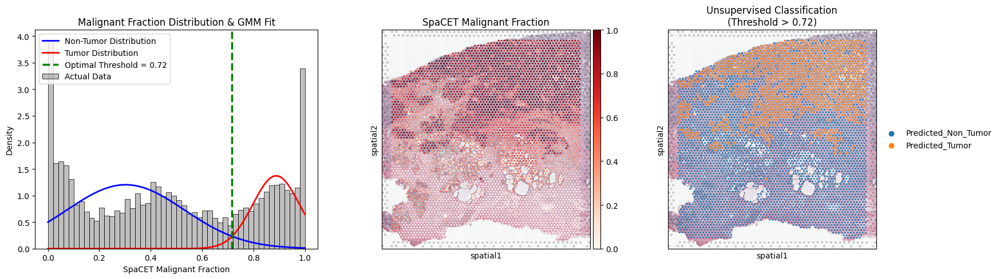

✅ 划分标签已保存至: /home/zhangjunyi/xiangmu/nichecompass-main/outputs/Human_Prostate_Cancer/SpaCET/GMM_Tumor_NonTumor_Pred_Labels.csv
✅ 阈值结果已保存至: /home/zhangjunyi/xiangmu/nichecompass-main/outputs/Human_Prostate_Cancer/SpaCET/GMM_Optimal_Threshold_Result.csv

🎉 全部完成！所有文件已保存至指定文件夹


In [4]:
# ===================== Cell 1-1 =====================
import anndata as ad
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.mixture import GaussianMixture
import os  # 新增：用于创建文件夹/路径管理

# ==========================================
# 🔥 固定输出路径（你指定的文件夹）
# ==========================================
SAVE_DIR = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/Human_Prostate_Cancer/SpaCET"
os.makedirs(SAVE_DIR, exist_ok=True)  # 自动创建文件夹，不存在则新建

# ==========================================
# 1. 读取数据
# ==========================================
file_path = "/home/zhangjunyi/xiangmu/nichecompass-main/datasets/Human_Prostate_Cancer/Human_Prostate_Cancer_annotated.h5ad"
print("正在加载数据...")
adata = ad.read_h5ad(file_path)

# ==========================================
# 1. 提取 SpaCET 的 Malignant 分数
# ==========================================
# 过滤掉 NaN 值（如果有背景点）
malignant_scores = adata.obs['Malignant'].dropna().values
# GMM 要求输入是 2D 数组 (n_samples, 1)
X = malignant_scores.reshape(-1, 1)

# ==========================================
# 2. 使用 GMM (高斯混合模型) 自动寻找最优阈值
# ==========================================
print("正在使用高斯混合模型 (GMM) 拟合数据分布...")
# 假设数据分为 2 类（肿瘤 vs 非肿瘤）
gmm = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gmm.fit(X)

# 找出两个分布的均值，区分哪个是非肿瘤(低均值)，哪个是肿瘤(高均值)
means = gmm.means_.flatten()
class_non_tumor_idx = np.argmin(means)
class_tumor_idx = np.argmax(means)

# 寻找两个正态分布交叉的边界点 (即最优阈值)
# 我们在两个均值之间生成 1000 个密集点，看哪一个点模型预测的分类发生了反转
x_test = np.linspace(means[class_non_tumor_idx], means[class_tumor_idx], 1000).reshape(-1, 1)
preds = gmm.predict(x_test)

# 找到分类反转的索引
flip_index = np.where(preds[:-1] != preds[1:])[0]

if len(flip_index) > 0:
    optimal_threshold = x_test[flip_index[0]][0]
else:
    # 极端情况下如果找不到交点，取两个均值的中间值
    optimal_threshold = np.mean(means)

print(f"✨ [无监督] 自动计算出的最优划分阈值为: {optimal_threshold:.4f}")

# ==========================================
# 3. 将新的划分应用到 adata 中
# ==========================================
col_name = f'Unsupervised_Pred_{optimal_threshold:.2f}'
adata.obs[col_name] = np.where(
    adata.obs['Malignant'] > optimal_threshold, 
    'Predicted_Tumor', 
    'Predicted_Non_Tumor'
)
adata.obs[col_name] = adata.obs[col_name].astype('category')

# ==========================================
# 4. 可视化：分布图 (解释为什么选这个阈值) + 空间图
# ==========================================
fig = plt.figure(figsize=(18, 5))

# -----------------
# 子图 1: 分数分布与 GMM 拟合曲线
# -----------------
ax1 = plt.subplot(1, 3, 1)
# 画直方图
sns.histplot(malignant_scores, bins=50, stat='density', alpha=0.5, color='gray', ax=ax1, label='Actual Data')

# 画 GMM 拟合出来的两个正态分布曲线
x_plot = np.linspace(0, 1, 1000).reshape(-1, 1)
logprob = gmm.score_samples(x_plot)
pdf = np.exp(logprob)
responsibilities = gmm.predict_proba(x_plot)

pdf_non_tumor = pdf * responsibilities[:, class_non_tumor_idx]
pdf_tumor = pdf * responsibilities[:, class_tumor_idx]

ax1.plot(x_plot, pdf_non_tumor, color='blue', label='Non-Tumor Distribution', lw=2)
ax1.plot(x_plot, pdf_tumor, color='red', label='Tumor Distribution', lw=2)

# 画阈值垂直线
ax1.axvline(optimal_threshold, color='green', linestyle='--', lw=2.5, 
            label=f'Optimal Threshold = {optimal_threshold:.2f}')

ax1.set_title('Malignant Fraction Distribution & GMM Fit')
ax1.set_xlabel('SpaCET Malignant Fraction')
ax1.set_ylabel('Density')
ax1.legend()

# -----------------
# 子图 2: SpaCET 连续分数的空间分布
# -----------------
ax2 = plt.subplot(1, 3, 2)
sc.pl.spatial(adata, color='Malignant', title='SpaCET Malignant Fraction', 
              spot_size=170, cmap='Reds', ax=ax2, show=False)

# -----------------
# 子图 3: 使用自动阈值划分后的离散空间分布
# -----------------
ax3 = plt.subplot(1, 3, 3)
sc.pl.spatial(adata, color=col_name, title=f'Unsupervised Classification\n(Threshold > {optimal_threshold:.2f})', 
              spot_size=170, ax=ax3, show=False)

plt.tight_layout()

# ==========================================
# 🔥 新增1：保存图片到指定路径（高清300dpi）
# ==========================================
img_save_path = os.path.join(SAVE_DIR, "GMM_Malignant_Threshold_Plot.png")
plt.savefig(img_save_path, dpi=300, bbox_inches='tight')
print(f"\n✅ 图片已保存至: {img_save_path}")

plt.show()

# ==========================================
# 🔥 新增2：保存肿瘤/非肿瘤划分标签为CSV
# ==========================================
label_save_path = os.path.join(SAVE_DIR, "GMM_Tumor_NonTumor_Pred_Labels.csv")
# 保存Spot ID + 划分标签 + 原始Malignant分数
label_df = adata.obs[[col_name, 'Malignant']].copy()
label_df.index.name = "Spot_ID"
label_df.to_csv(label_save_path, encoding='utf-8-sig')
print(f"✅ 划分标签已保存至: {label_save_path}")

# ==========================================
# 🔥 新增3：保存最优阈值结果为CSV
# ==========================================
threshold_save_path = os.path.join(SAVE_DIR, "GMM_Optimal_Threshold_Result.csv")
threshold_df = pd.DataFrame({
    "Metric": ["Optimal_GMM_Threshold"],
    "Value": [round(optimal_threshold, 4)]
})
threshold_df.to_csv(threshold_save_path, index=False, encoding='utf-8-sig')
print(f"✅ 阈值结果已保存至: {threshold_save_path}")

print("\n🎉 全部完成！所有文件已保存至指定文件夹")

SpaCET
利用当前阈值计算ARI


===== 正在绘制空间分布对比图 =====


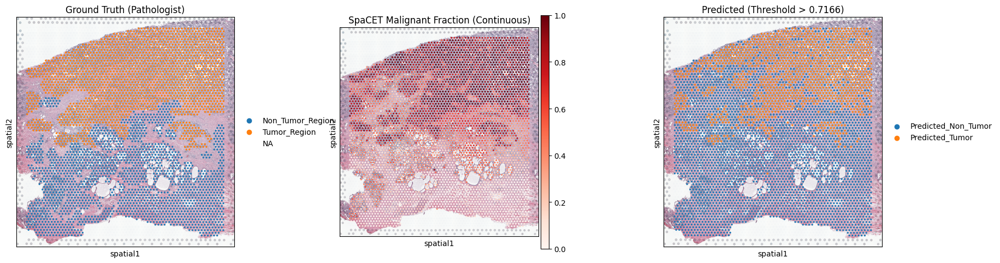


🚀 开始执行 SpaCET 基线模型的全维度指标评估...
🟢 [1/3] 宏观边界评估 (Supervised):
  --> Adjusted Rand Index (ARI): 0.4824
  --> F1-Score (Tumor Region): 0.8278

🔵 [2/3] 微观特征纯度评估 (Unsupervised):
  --> 正在计算 PCA 作为底层转录组特征空间...
  --> Average Silhouette Width (ASW): 0.2670
  --> Silhouette Score on Malignant Fraction (SS-C Proxy): 0.6024
  --> Davies-Bouldin Index (DBI): 1.0473

🟣 [3/3] 物理空间连贯性指标 (Moran's I):
  --> 正在计算空间邻接图...


  0%|          | 0/100 [00:00<?, ?/s]

  --> 总体平均 Moran's Index (Moran's I): 0.7200

🎉 SpaCET 基线指标计算完毕！汇总表格已成功保存至：
   /home/zhangjunyi/xiangmu/nichecompass-main/outputs/zhibiao/Human_breast_cancer_ViHBC/SpaCET/评估结果_SpaCET.csv


,Metric Name,Abbreviation,Value,Ideal Trend,Evaluation Dimension
0,Adjusted Rand Index,ARI,0.4824,Closer to 1,Macro Boundary (Supervised)
1,F1-Score,F1,0.8278,Closer to 1,Macro Boundary (Supervised)
2,Average Silhouette Width,ASW,0.2670,Closer to 1,Micro Pureness (Unsupervised)
3,Silhouette Score on Coupling Scores,SS-C,0.6024,Closer to 1,Micro Pureness (Unsupervised)
4,Davies-Bouldin Index,DBI,1.0473,Closer to 0,Micro Pureness (Unsupervised)
5,Moran's Index,Moran's I,0.7200,Closer to 1 (>0),Spatial Topology (Physical)


In [8]:
# ===================== Cell 1-2 (升级版：全维度指标评估) =====================
import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import squidpy as sq
import matplotlib.pyplot as plt
import os
import warnings
from sklearn.metrics import (
    adjusted_rand_score, 
    f1_score, 
    silhouette_score, 
    davies_bouldin_score
)

warnings.filterwarnings("ignore")

# ==========================================
# 1. 准备数据与真实标签映射 (Ground Truth)
# 【修复】替换为你的病理注释标签，仅修改映射和列名
# ==========================================
# 你的前列腺癌病理标签映射：Invasive carcinoma=肿瘤(1)，其余=非肿瘤(0)
gt_map_int = {
    'Invasive carcinoma': 1,
    'Fibro-muscular tissue': 0,
    'Normal gland': 0,
    'Fibrous tissue': 0,
    'Nerve': 0,
    'Blood vessel': 0,
    'Immune Cells': 0
}

gt_map_str = {
    'Invasive carcinoma': 'Tumor_Region',
    'Fibro-muscular tissue': 'Non_Tumor_Region',
    'Normal gland': 'Non_Tumor_Region',
    'Fibrous tissue': 'Non_Tumor_Region',
    'Nerve': 'Non_Tumor_Region',
    'Blood vessel': 'Non_Tumor_Region',
    'Immune Cells': 'Non_Tumor_Region'
}

# 【核心修复】把 annot_type 改为你的列名 Pathology_Annotation
adata.obs['Ground_Truth_Binary'] = adata.obs['Pathology_Annotation'].map(gt_map_str).astype('category')
gt_labels_for_math = adata.obs['Pathology_Annotation'].map(gt_map_int).values

# ==========================================
# 2. 生成预测标签 (基于 GMM 的自适应最优阈值)
# ==========================================
# 自动读取上一步算出的最优阈值
threshold = optimal_threshold if 'optimal_threshold' in locals() else 0.5282  

# 生成预测的字符串标签（用于画图）
adata.obs[f'Pred_Threshold_{threshold:.4f}'] = np.where(
    adata.obs['Malignant'] > threshold, 
    'Predicted_Tumor', 
    'Predicted_Non_Tumor'
)
adata.obs[f'Pred_Threshold_{threshold:.4f}'] = adata.obs[f'Pred_Threshold_{threshold:.4f}'].astype('category')

# 生成预测的整数标签（用于计算数学指标：1为肿瘤，0为健康）
pred_labels_for_math = (adata.obs['Malignant'] > threshold).astype(float).values

# ==========================================
# 3. 空间可视化 (核对切割是否合理)
# ==========================================
print("\n===== 正在绘制空间分布对比图 =====")
try:
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))
    sc.pl.spatial(adata, color='Ground_Truth_Binary', title='Ground Truth (Pathologist)', spot_size=170, ax=axs[0], show=False)
    sc.pl.spatial(adata, color='Malignant', title='SpaCET Malignant Fraction (Continuous)', spot_size=170, cmap='Reds', ax=axs[1], show=False)
    sc.pl.spatial(adata, color=f'Pred_Threshold_{threshold:.4f}', title=f'Predicted (Threshold > {threshold:.4f})', spot_size=170, ax=axs[2], show=False)
    plt.tight_layout()
    plt.show()
except Exception as e:
    print(f"可视化失败: {e}")

# ==========================================
# 4. 全维度空间与特征指标综合评估 (SpaCET Baseline)
# ==========================================
print("\n" + "="*60)
print("🚀 开始执行 SpaCET 基线模型的全维度指标评估...")
print("="*60)

# --- 模块一：宏观边界评估 (Supervised) ---
valid_mask = ~np.isnan(gt_labels_for_math)
y_true = gt_labels_for_math[valid_mask]
y_pred = pred_labels_for_math[valid_mask]

ari_val = adjusted_rand_score(y_true, y_pred)
f1_val = f1_score(y_true, y_pred, pos_label=1.0, average='binary')

print(f"🟢 [1/3] 宏观边界评估 (Supervised):")
print(f"  --> Adjusted Rand Index (ARI): {ari_val:.4f}")
print(f"  --> F1-Score (Tumor Region): {f1_val:.4f}")

# --- 模块二：微观特征纯度评估 (Unsupervised) ---
print(f"\n🔵 [2/3] 微观特征纯度评估 (Unsupervised):")
if 'X_pca' not in adata.obsm:
    print("  --> 正在计算 PCA 作为底层转录组特征空间...")
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.tl.pca(adata, svd_solver='arpack')

X_features = adata.obsm['X_pca']

asw_val = silhouette_score(X_features, pred_labels_for_math)
dbi_val = davies_bouldin_score(X_features, pred_labels_for_math)

X_spacet_feature = adata.obs['Malignant'].values.reshape(-1, 1)
ssc_val = silhouette_score(X_spacet_feature, pred_labels_for_math)

print(f"  --> Average Silhouette Width (ASW): {asw_val:.4f}")
print(f"  --> Silhouette Score on Malignant Fraction (SS-C Proxy): {ssc_val:.4f}")
print(f"  --> Davies-Bouldin Index (DBI): {dbi_val:.4f}")

# --- 模块三：物理空间连贯性指标 (Spatial Topology) ---
print(f"\n🟣 [3/3] 物理空间连贯性指标 (Moran's I):")
if 'spatial_connectivities' not in adata.obsp:
    print("  --> 正在计算空间邻接图...")
    sq.gr.spatial_neighbors(adata, coord_type="generic", spatial_key="spatial", n_neighs=6)

tmp_adata = sc.AnnData(X=pred_labels_for_math.reshape(-1, 1).astype(float))
tmp_adata.obs_names = adata.obs_names
tmp_adata.var_names = ['SpaCET_Tumor_Pred']
tmp_adata.obsp['spatial_connectivities'] = adata.obsp['spatial_connectivities']

sq.gr.spatial_autocorr(tmp_adata, mode="moran", genes=['SpaCET_Tumor_Pred'], n_perms=100, n_jobs=-1)
moran_val = tmp_adata.uns["moranI"].loc['SpaCET_Tumor_Pred', 'I']

print(f"  --> 总体平均 Moran's Index (Moran's I): {moran_val:.4f}")

# ==========================================
# 5. 汇总并保存指标 CSV
# ==========================================
SAVE_DIR = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/zhibiao/Human_breast_cancer_ViHBC/SpaCET"
os.makedirs(SAVE_DIR, exist_ok=True)
csv_save_path = os.path.join(SAVE_DIR, "评估结果_SpaCET.csv")

results_df = pd.DataFrame({
    "Metric Name": [
        "Adjusted Rand Index", 
        "F1-Score", 
        "Average Silhouette Width", 
        "Silhouette Score on Coupling Scores", 
        "Davies-Bouldin Index", 
        "Moran's Index"
    ],
    "Abbreviation": ["ARI", "F1", "ASW", "SS-C", "DBI", "Moran's I"],
    "Value": [
        round(ari_val, 4), 
        round(f1_val, 4), 
        round(asw_val, 4), 
        round(ssc_val, 4), 
        round(dbi_val, 4), 
        round(moran_val, 4)
    ],
    "Ideal Trend": [
        "Closer to 1", "Closer to 1", "Closer to 1", 
        "Closer to 1", "Closer to 0", "Closer to 1 (>0)"
    ],
    "Evaluation Dimension": [
        "Macro Boundary (Supervised)", 
        "Macro Boundary (Supervised)", 
        "Micro Pureness (Unsupervised)", 
        "Micro Pureness (Unsupervised)", 
        "Micro Pureness (Unsupervised)", 
        "Spatial Topology (Physical)"
    ]
})

results_df.to_csv(csv_save_path, index=False, encoding="utf-8-sig")

print("\n" + "="*60)
print(f"🎉 SpaCET 基线指标计算完毕！汇总表格已成功保存至：\n   {csv_save_path}")
print("="*60)
display(results_df)  # 普通Python环境注释此行，Jupyter可保留

In [1]:
# =========================================================
# Cell 0: 全局可复现设置（必须放在最前面）
# =========================================================
import os
import random
import numpy as np

SEED = 42

# Python / Hash
os.environ["PYTHONHASHSEED"] = str(SEED)

# GPU 选择（保留你的设置）
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# 为了更强复现，尽量单线程
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OPENBLAS_NUM_THREADS"] = "1"
os.environ["NUMEXPR_NUM_THREADS"] = "1"

# CUDA 某些算子的确定性
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"

random.seed(SEED)
np.random.seed(SEED)

import torch
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

try:
    torch.use_deterministic_algorithms(True, warn_only=True)
except Exception as e:
    print("deterministic warn_only 模式未完全启用：", e)

torch.set_num_threads(1)

print(f"✅ 全局随机种子已固定为 {SEED}")

✅ 全局随机种子已固定为 42


In [2]:
# =========================================================
# Cell 2: 环境配置与 NicheCompass 导入
# =========================================================
import os
import sys
import warnings

warnings.filterwarnings("ignore")

import torch
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import decoupler as dc
import scipy.sparse as sp
from io import StringIO
from sklearn.preprocessing import MinMaxScaler

LOCAL_SRC = "/home/zhangjunyi/xiangmu/nichecompass-main/src"
if LOCAL_SRC not in sys.path:
    sys.path.insert(0, LOCAL_SRC)

import nichecompass as nc

print("✅ CUDA 可用状态:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("✅ 当前使用 GPU:", torch.cuda.get_device_name(0))
print("✅ NicheCompass 路径:", nc.__file__)
print("✅ 当前 SEED:", SEED)

✅ CUDA 可用状态: True
✅ 当前使用 GPU: A100 80GB PCIe
✅ NicheCompass 路径: /home/zhangjunyi/xiangmu/nichecompass-main/src/nichecompass/__init__.py
✅ 当前 SEED: 42


In [3]:
# =========================================================
# Cell 3: 知识库提取与数据加载 (Step 1)
# =========================================================
print("=== Step 1: 构建代谢通讯轴四元组知识库 ===")

# 1. 解析你的四元组知识库
tmcn_csv = """TMCN_Name,Source_Pathways,Source_Genes,Target_Genes,Biologic_Meaning
TMCN_Lactate_Axis,"Hypoxia,EGFR,PI3K,MAPK","SLC2A1,HK2,PKM,LDHA,LDHB,SLC16A3","SLC16A1,SLC16A7,HCAR1,HCAR2",乳酸_肿瘤酸化瓦伯格效应与基质反向代谢共生
TMCN_Adenosine_Axis,"Hypoxia,TGFb,NFkB,MAPK","ENTPD1,ENTPD2,NT5E,CD38,ENPP1,NT5C2","ADORA1,ADORA2A,ADORA2B,ADORA3,SLC29A1,SLC29A2",腺苷_ATP水解级联驱动的强效免疫抑制与M2极化
TMCN_PGE2_Axis,"NFkB,JAK-STAT,Hypoxia,MAPK,TNFa","PLA2G4A,PTGS2,PTGES,ABCC4,SLCO2A1","PTGER1,PTGER2,PTGER3,PTGER4",前列腺素E2_成纤维细胞激活与促癌炎症微环境重塑
TMCN_Glutamine_Axis,"PI3K,MAPK,JAK-STAT,TGFb,WNT","GLUL,SLC38A1,SLC38A3,SLC38A5","SLC1A5,SLC7A5,SLC38A2,GLS,GLUD1",谷氨酰胺_基质向肿瘤供能的代谢寄生与大分子合成
TMCN_Succinate_Axis,"Hypoxia,NFkB,TNFa","SLC13A2,SLC13A3,SLC25A10","SUCNR1",琥珀酸_缺血坏死区释放驱动的TAM致瘤极化与血管生成
TMCN_Kynurenine_Axis,"JAK-STAT,NFkB,TGFb","IDO1,TDO2,KYNU,SLC7A5","AHR",犬尿氨酸_色氨酸剥夺与AHR介导的效应T细胞耗竭
TMCN_ATP_Axis,"Hypoxia,p53,TNFa","PANX1,SLC17A9","P2RX7,P2RY2,P2RY11",胞外ATP_坏死边缘释放的促炎性危险信号(DAMP)传导
TMCN_S1P_Axis,"NFkB,PI3K,MAPK","SPHK1,SPHK2,SPNS2","S1PR1,S1PR2,S1PR3",鞘氨醇-1-磷酸_脂质信号驱动的内皮血管生成与免疫趋化
TMCN_LPA_Axis,"PI3K,MAPK,TGFb","ENPP2,PLA2G4A,LPCAT1","LPAR1,LPAR2,LPAR3,LPAR5",溶血磷脂酸_成纤维细胞基质重塑与肿瘤高侵袭性
TMCN_Glutamate_Axis,"PI3K,MAPK,Hypoxia","GLS,SLC1A5,SLC7A11","GRM3,GRM5,GRIN1",谷氨酸_突触样代谢通讯与微环境神经可塑性
"""
axis_table = pd.read_csv(StringIO(tmcn_csv))
AXES =[x.replace("TMCN_", "").replace("_Axis", "") for x in axis_table["TMCN_Name"]]

# 辅助函数：解析基因列表
def split_items(x):
    return[i.strip() for i in str(x).split(",") if i.strip()]

def get_valid_genes(adata, genes):
    return[g for g in genes if g in adata.var_names]

# 2. 加载带有 SpaCET 结果的空间转录组数据（必须读取 _with_SpaCET.h5ad）
file_path = "/home/zhangjunyi/xiangmu/nichecompass-main/datasets/Human_Prostate_Cancer/Human_Prostate_Cancer_annotated.h5ad"
adata = sc.read_h5ad(file_path)

print(f"✅ 数据加载成功: {adata.n_obs} spots, {adata.n_vars} genes")
display(axis_table)

=== Step 1: 构建代谢通讯轴四元组知识库 ===


✅ 数据加载成功: 4371 spots, 17943 genes


,TMCN_Name,Source_Pathways,Source_Genes,Target_Genes,Biologic_Meaning
0,TMCN_Lactate_Axis,"Hypoxia,EGFR,PI3K,MAPK","SLC2A1,HK2,PKM,LDHA,LDHB,SLC16A3","SLC16A1,SLC16A7,HCAR1,HCAR2",乳酸_肿瘤酸化瓦伯格效应与基质反向代谢共生
1,TMCN_Adenosine_Axis,"Hypoxia,TGFb,NFkB,MAPK","ENTPD1,ENTPD2,NT5E,CD38,ENPP1,NT5C2","ADORA1,ADORA2A,ADORA2B,ADORA3,SLC29A1,SLC29A2",腺苷_ATP水解级联驱动的强效免疫抑制与M2极化
2,TMCN_PGE2_Axis,"NFkB,JAK-STAT,Hypoxia,MAPK,TNFa","PLA2G4A,PTGS2,PTGES,ABCC4,SLCO2A1","PTGER1,PTGER2,PTGER3,PTGER4",前列腺素E2_成纤维细胞激活与促癌炎症微环境重塑
3,TMCN_Glutamine_Axis,"PI3K,MAPK,JAK-STAT,TGFb,WNT","GLUL,SLC38A1,SLC38A3,SLC38A5","SLC1A5,SLC7A5,SLC38A2,GLS,GLUD1",谷氨酰胺_基质向肿瘤供能的代谢寄生与大分子合成
4,TMCN_Succinate_Axis,"Hypoxia,NFkB,TNFa","SLC13A2,SLC13A3,SLC25A10",SUCNR1,琥珀酸_缺血坏死区释放驱动的TAM致瘤极化与血管生成
5,TMCN_Kynurenine_Axis,"JAK-STAT,NFkB,TGFb","IDO1,TDO2,KYNU,SLC7A5",AHR,犬尿氨酸_色氨酸剥夺与AHR介导的效应T细胞耗竭
6,TMCN_ATP_Axis,"Hypoxia,p53,TNFa","PANX1,SLC17A9","P2RX7,P2RY2,P2RY11",胞外ATP_坏死边缘释放的促炎性危险信号(DAMP)传导
7,TMCN_S1P_Axis,"NFkB,PI3K,MAPK","SPHK1,SPHK2,SPNS2","S1PR1,S1PR2,S1PR3",鞘氨醇-1-磷酸_脂质信号驱动的内皮血管生成与免疫趋化
8,TMCN_LPA_Axis,"PI3K,MAPK,TGFb","ENPP2,PLA2G4A,LPCAT1","LPAR1,LPAR2,LPAR3,LPAR5",溶血磷脂酸_成纤维细胞基质重塑与肿瘤高侵袭性
9,TMCN_Glutamate_Axis,"PI3K,MAPK,Hypoxia","GLS,SLC1A5,SLC7A11","GRM3,GRM5,GRIN1",谷氨酸_突触样代谢通讯与微环境神经可塑性


In [4]:
# =========================================================
# Cell 4: 连续功能分数推断与解耦 (Step 2)
# =========================================================
print("=== Step 2: 计算 Spot 级连续分数 (绝对无监督解耦) ===")

# 1. 运行 PROGENy 提取 Pathway_score
print("--> 正在计算 Pathway_score (PROGENy)...")
net_progeny = dc.get_progeny(organism="human", top=500)
dc.run_mlm(mat=adata, net=net_progeny, source="source", target="target", weight="weight", verbose=False, use_raw=False)
df_pathway = dc.get_acts(adata, obsm_key="mlm_estimate").to_df()
df_pathway.columns =[c.strip().replace("-", "_").replace(" ", "_") for c in df_pathway.columns]

# 2. 运行 AUCell 提取 Enzyme_score
print("--> 正在计算 Enzyme_score (AUCell)...")
enzyme_records =[]
for _, row in axis_table.iterrows():
    ax = row["TMCN_Name"].replace("TMCN_", "").replace("_Axis", "")
    for g in split_items(row["Source_Genes"]):
        if g in adata.var_names:
            enzyme_records.append({"source": ax, "target": g})
dc.run_aucell(mat=adata, net=pd.DataFrame(enzyme_records), source="source", target="target", min_n=1, verbose=False, use_raw=False)
df_enzyme = dc.get_acts(adata, obsm_key="aucell_estimate").to_df()

# 3. 对通路和酶进行 MinMax 归一化 (0~1)
scaler = MinMaxScaler()
df_pathway_scaled = pd.DataFrame(scaler.fit_transform(df_pathway), index=df_pathway.index, columns=df_pathway.columns)
df_enzyme_scaled = pd.DataFrame(scaler.fit_transform(df_enzyme), index=df_enzyme.index, columns=df_enzyme.columns)

# 4. 提取 Receptor_score 并计算 Sender & Receiver 最终分数
print("--> 正在计算 Sender_score 与 Receiver_score...")
def calc_receptor_score(genes):
    valid = get_valid_genes(adata, genes)
    if not valid: return np.zeros(adata.n_obs)
    X_sub = adata[:, valid].X
    mean_exp = np.asarray(X_sub.mean(axis=1)).reshape(-1) if sp.issparse(X_sub) else np.asarray(X_sub).mean(axis=1).reshape(-1)
    return scaler.fit_transform(mean_exp.reshape(-1, 1)).flatten()

for _, row in axis_table.iterrows():
    ax = row["TMCN_Name"].replace("TMCN_", "").replace("_Axis", "")
    pathways =[p.strip().replace("-", "_").replace(" ", "_") for p in split_items(row["Source_Pathways"])]
    target_genes = split_items(row["Target_Genes"])
    
    # 提取存在的通路
    valid_paths =[p for p in pathways if p in df_pathway_scaled.columns]
    
    # Sender = Pathway (均值) * Enzyme
    p_score = df_pathway_scaled[valid_paths].mean(axis=1).values
    e_score = df_enzyme_scaled[ax].values
    adata.obs[f"{ax}_Sender_Score"] = p_score * e_score
    
    # Receiver = Receptor 表达量归一化
    adata.obs[f"{ax}_Receiver_Score"] = calc_receptor_score(target_genes)

print("✅ 所有连续分数提取完毕！保存在 adata.obs 中。")
# 预览前5行打分
score_cols =[c for c in adata.obs.columns if "Sender_Score" in c or "Receiver_Score" in c]
display(adata.obs[score_cols].head())

=== Step 2: 计算 Spot 级连续分数 (绝对无监督解耦) ===
--> 正在计算 Pathway_score (PROGENy)...
--> 正在计算 Enzyme_score (AUCell)...
--> 正在计算 Sender_score 与 Receiver_score...
✅ 所有连续分数提取完毕！保存在 adata.obs 中。


,Lactate_Sender_Score,Lactate_Receiver_Score,Adenosine_Sender_Score,Adenosine_Receiver_Score,PGE2_Sender_Score,PGE2_Receiver_Score,Glutamine_Sender_Score,Glutamine_Receiver_Score,Succinate_Sender_Score,Succinate_Receiver_Score,Kynurenine_Sender_Score,Kynurenine_Receiver_Score,ATP_Sender_Score,ATP_Receiver_Score,S1P_Sender_Score,S1P_Receiver_Score,LPA_Sender_Score,LPA_Receiver_Score,Glutamate_Sender_Score,Glutamate_Receiver_Score
AAACAAGTATCTCCCA-1,0.0,0.4,0.000000,0.166667,0.173196,0.2,0.177798,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.222222,0.0,0.1,0.0,0.0
AAACACCAATAACTGC-1,0.0,0.2,0.000000,0.166667,0.000000,0.2,0.174453,0.428571,0.0,0.0,0.0,0.2,0.0,0.8,0.0,0.000000,0.0,0.1,0.0,0.0
AAACAGAGCGACTCCT-1,0.0,0.0,0.082582,0.000000,0.139238,0.0,0.053031,0.238095,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.2,0.0,0.0
AAACAGCTTTCAGAAG-1,0.0,0.0,0.047114,0.500000,0.269533,0.0,0.181217,0.238095,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111111,0.0,0.1,0.0,0.0
AAACAGGGTCTATATT-1,0.0,0.4,0.209058,0.333333,0.087119,0.2,0.208135,0.238095,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0


===== Cell 4: Step 3 - 无监督训练与生成“微型生态位” =====
注意：这段代码中，NicheCompass 只看 高变基因和基础空间图，完全屏蔽了刚才算出来的代谢特征！

=== Step 3: NicheCompass 构建物理联通图与微型生态位骨架 ===
✅ HVG 保留后基因数: 3018
✅ 强制保留的 TMCN 基因数: 62
✅ 保留 4371 个有效spots（已移除总计数为0的spots）


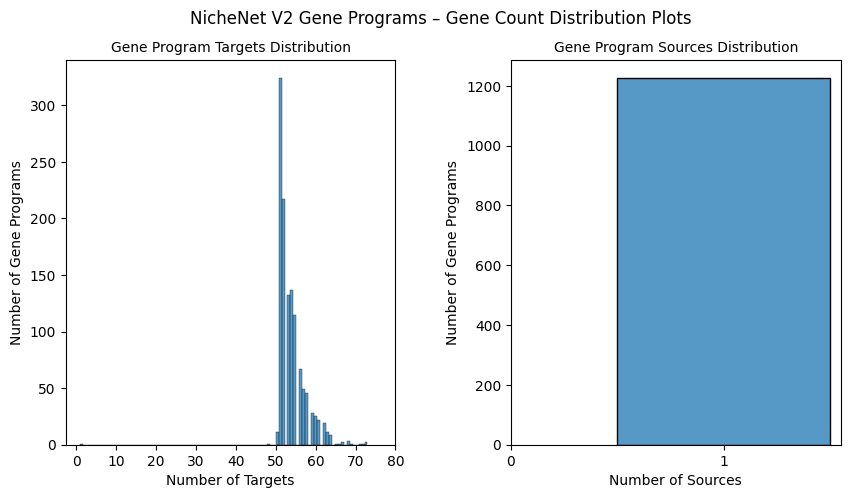

--- INITIALIZING NEW NETWORK MODULE: VARIATIONAL GENE PROGRAM GRAPH AUTOENCODER ---
LOSS -> include_edge_recon_loss: True, include_gene_expr_recon_loss: True, rna_recon_loss: nb
NODE LABEL METHOD -> one-hop-norm
ACTIVE GP THRESHOLD RATIO -> 0.01
LOG VARIATIONAL -> True
ONE HOP GCN NORM RNA NODE LABEL AGGREGATOR
ENCODER -> n_input: 3018, n_cat_covariates_embed_input: 0, n_hidden: 1325, n_latent: 1225, n_addon_latent: 100, n_fc_layers: 1, n_layers: 1, conv_layer: gcnconv, n_attention_heads: 0, dropout_rate: 0.0, 
COSINE SIM GRAPH DECODER -> dropout_rate: 0.0
MASKED TARGET RNA DECODER -> n_prior_gp_input: 1225, n_addon_gp_input: 100, n_cat_covariates_embed_input: 0, n_output: 3018
MASKED SOURCE RNA DECODER -> n_prior_gp_input: 1225, n_addon_gp_input: 100, n_cat_covariates_embed_input: 0, n_output: 3018
全量 nodes: 4371
全量 edges: 34968

--- INITIALIZING TRAINER ---


In [ ]:
# =========================================================
# Cell 5: NicheCompass 无监督拓扑学习与过聚类
# =========================================================
print("=== Step 3: NicheCompass 构建物理联通图与微型生态位骨架 ===")

# 1) 基础过滤
adata_model = adata.copy()
sc.pp.filter_genes(adata_model, min_cells=10)

# 2) 先找 HVG（只打标记，不立刻 subset）
sc.pp.highly_variable_genes(
    adata_model,
    n_top_genes=3000,
    flavor="seurat_v3",
    subset=False
)

# 3) 强制保留所有 TMCN 四元组中的 Source_Genes + Target_Genes
tmcn_gene_set = set()

for _, row in axis_table.iterrows():
    tmcn_gene_set.update(split_items(row["Source_Genes"]))
    tmcn_gene_set.update(split_items(row["Target_Genes"]))

tmcn_gene_set = {g for g in tmcn_gene_set if g in adata_model.var_names}

# 4) 最终保留 = HVG ∪ TMCN genes
keep_mask = adata_model.var["highly_variable"].values | adata_model.var_names.isin(list(tmcn_gene_set))
adata_model = adata_model[:, keep_mask].copy()

print(f"✅ HVG 保留后基因数: {adata_model.n_vars}")
print(f"✅ 强制保留的 TMCN 基因数: {len(tmcn_gene_set)}")

# 2) 矩阵清洗与过滤 (优化：合并执行处理 0 计数点和 NaN/Inf 清洗)
counts_key = "counts" if "counts" in adata_model.layers else None
x_for_lib = adata_model.layers[counts_key] if counts_key is not None else adata_model.X
lib_size = np.asarray(x_for_lib.sum(axis=1)).reshape(-1)
valid_spot_mask = np.isfinite(lib_size) & (lib_size > 0)
adata_model = adata_model[valid_spot_mask].copy()
print(f"✅ 保留 {adata_model.n_obs} 个有效spots（已移除总计数为0的spots）")

mat = adata_model.layers.get(counts_key) if counts_key else adata_model.X
if sp.issparse(mat):
    mat = mat.copy()
    mat.data = np.nan_to_num(mat.data, nan=0.0, posinf=0.0, neginf=0.0)
    mat.data = np.clip(mat.data, a_min=0, a_max=None)
else:
    mat = np.nan_to_num(mat, nan=0.0, posinf=0.0, neginf=0.0)
    mat = np.clip(mat, a_min=0, a_max=None)
if counts_key: adata_model.layers[counts_key] = mat
else: adata_model.X = mat

# 3) 空间图 + LR先验
sq.gr.spatial_neighbors(adata_model, coord_type="generic", spatial_key="spatial", n_neighs=8)
cache_dir = "/home/zhangjunyi/xiangmu/nichecompass-main/cache_nichenet"
gp_dict = nc.utils.extract_gp_dict_from_nichenet_lrt_interactions(
    species="human", version="v2", keep_target_genes_ratio=0.25, max_n_target_genes_per_gp=50,
    load_from_disk=True, lr_network_file_path=f"{cache_dir}/nichenet_lr_network.csv",
    ligand_target_matrix_file_path=f"{cache_dir}/nichenet_ligand_target_matrix.csv"
)
nc.utils.add_gps_from_gp_dict_to_adata(gp_dict=gp_dict, adata=adata_model)

# 4) Initialize + Train Model
model = nc.models.NicheCompass(
    adata_model, counts_key=counts_key, adj_key="spatial_connectivities",
    gp_names_key="nichecompass_gp_names", active_gp_names_key="nichecompass_active_gp_names",
    gp_targets_mask_key="nichecompass_gp_targets", gp_targets_categories_mask_key="nichecompass_gp_targets_categories",
    gp_sources_mask_key="nichecompass_gp_sources", gp_sources_categories_mask_key="nichecompass_gp_sources_categories",
    latent_key="nichecompass_latent", conv_layer_encoder="gcnconv", active_gp_thresh_ratio=0.01,
)

# 全图训练所需的完整规模
full_node_batch_size = adata_model.n_obs
full_edge_batch_size = int(adata_model.obsp["spatial_connectivities"].nnz)

print(f"全量 nodes: {full_node_batch_size}")
print(f"全量 edges: {full_edge_batch_size}")

model.train(
    n_epochs=100, n_epochs_all_gps=10, lr=1e-4, lambda_edge_recon=1e5,
    lambda_gene_expr_recon=100.0, lambda_l1_masked=0.0, edge_batch_size=full_edge_batch_size,
    node_batch_size=full_node_batch_size, n_sampled_neighbors=4, edge_val_ratio=0.0, node_val_ratio=0.0,
    use_cuda_if_available=True, verbose=False
)
# =========================================================
# 保存结果 (AnnData + 模型)
# =========================================================
import os
# 5) 保存结果
# -------------------------- 1. 设置保存路径 --------------------------
save_base_dir = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My"
file_prefix = "Human_Prostate_Cancer"
os.makedirs(save_base_dir, exist_ok=True)

adata_model.write_h5ad(os.path.join(save_base_dir, f"{file_prefix}.h5ad"))
model.save(
    os.path.join(save_base_dir, f"{file_prefix}_model"),
    overwrite=True
)
print("✅ [AnnData & Model] 结果已保存！\n=== Step 3 & 4 全部完成 ===")

In [ ]:
# # ===================== Cell 5 =====================
# # =========================================================
# # Step3: NicheCompass 无监督拓扑学习与过聚类（作者教程参数对齐版，NaN稳健）
# # 可直接在单元格运行
# # =========================================================
# import scipy.sparse as sp
# import numpy as np
# import pandas as pd
# import scanpy as sc
# import squidpy as sq
# import matplotlib.pyplot as plt

# print("=== Step 3: NicheCompass 构建物理联通图与微型生态位骨架（教程参数对齐版）===")

# # 1) 基础过滤 + 矩阵清洗
# sc.pp.filter_genes(adata, min_cells=10)
# adata_model = adata.copy()

# if "counts" in adata_model.layers:
#     mat = adata_model.layers["counts"]
#     if sp.issparse(mat):
#         mat = mat.copy()
#         mat.data = np.nan_to_num(mat.data, nan=0.0, posinf=0.0, neginf=0.0)
#         mat.data = np.clip(mat.data, a_min=0, a_max=None)
#         adata_model.layers["counts"] = mat
#     else:
#         mat = np.nan_to_num(mat, nan=0.0, posinf=0.0, neginf=0.0)
#         adata_model.layers["counts"] = np.clip(mat, a_min=0, a_max=None)

# # 2) 不再筛选2000个高变基因（已移除），使用所有通过 min_cells=10 过滤的基因。

# # 2.1) 关键修复：去掉总计数为0的spot，避免log(0) -> inf -> NaN
# counts_key = "counts" if "counts" in adata_model.layers else None
# x_for_lib = adata_model.layers[counts_key] if counts_key is not None else adata_model.X
# lib_size = np.asarray(x_for_lib.sum(axis=1)).reshape(-1)
# valid_spot_mask = np.isfinite(lib_size) & (lib_size > 0)
# adata_model = adata_model[valid_spot_mask].copy()
# print(f"✅ 保留 {adata_model.n_obs} 个有效spots（已移除总计数为0/非有限spots）")

# # 再清洗一次，确保无NaN/Inf
# if counts_key is not None:
#     mat = adata_model.layers[counts_key]
#     if sp.issparse(mat):
#         mat = mat.copy()
#         mat.data = np.nan_to_num(mat.data, nan=0.0, posinf=0.0, neginf=0.0)
#         mat.data = np.clip(mat.data, a_min=0, a_max=None)
#         adata_model.layers[counts_key] = mat
#     else:
#         mat = np.nan_to_num(mat, nan=0.0, posinf=0.0, neginf=0.0)
#         adata_model.layers[counts_key] = np.clip(mat, a_min=0, a_max=None)

# # 3) 空间图 + LR先验
# sq.gr.spatial_neighbors(adata_model, coord_type="generic", spatial_key="spatial", n_neighs=8)
# cache_dir = "/home/zhangjunyi/xiangmu/nichecompass-main/cache_nichenet"
# gp_dict = nc.utils.extract_gp_dict_from_nichenet_lrt_interactions(
#     species="human", version="v2",
#     keep_target_genes_ratio=0.25, max_n_target_genes_per_gp=50,
#     load_from_disk=True,
#     lr_network_file_path=f"{cache_dir}/nichenet_lr_network.csv",
#     ligand_target_matrix_file_path=f"{cache_dir}/nichenet_ligand_target_matrix.csv"
# )
# nc.utils.add_gps_from_gp_dict_to_adata(gp_dict=gp_dict, adata=adata_model)

# # 4) 参照官方教程的 key/参数
# adj_key = "spatial_connectivities"
# gp_names_key = "nichecompass_gp_names"
# active_gp_names_key = "nichecompass_active_gp_names"
# gp_targets_mask_key = "nichecompass_gp_targets"
# gp_targets_categories_mask_key = "nichecompass_gp_targets_categories"
# gp_sources_mask_key = "nichecompass_gp_sources"
# gp_sources_categories_mask_key = "nichecompass_gp_sources_categories"
# latent_key = "nichecompass_latent"
# conv_layer_encoder = "gcnconv"
# active_gp_thresh_ratio = 0.01

# # 训练参数（稳健版：降低NaN风险）
# n_epochs = 50
# n_epochs_all_gps = 10
# lr = 1e-4
# lambda_edge_recon = 1e5
# lambda_gene_expr_recon = 100.0
# lambda_l1_masked = 0.0
# edge_batch_size = 64
# node_batch_size = 128
# n_sampled_neighbors = 4

# # 5) Initialize + Train
# model = nc.models.NicheCompass(
#     adata_model,
#     counts_key=counts_key,
#     adj_key=adj_key,
#     gp_names_key=gp_names_key,
#     active_gp_names_key=active_gp_names_key,
#     gp_targets_mask_key=gp_targets_mask_key,
#     gp_targets_categories_mask_key=gp_targets_categories_mask_key,
#     gp_sources_mask_key=gp_sources_mask_key,
#     gp_sources_categories_mask_key=gp_sources_categories_mask_key,
#     latent_key=latent_key,
#     conv_layer_encoder=conv_layer_encoder,
#     active_gp_thresh_ratio=active_gp_thresh_ratio,
# )

# model.train(
#     n_epochs=n_epochs,
#     n_epochs_all_gps=n_epochs_all_gps,
#     lr=lr,
#     lambda_edge_recon=lambda_edge_recon,
#     lambda_gene_expr_recon=lambda_gene_expr_recon,
#     lambda_l1_masked=lambda_l1_masked,
#     edge_batch_size=edge_batch_size,
#     node_batch_size=node_batch_size,
#     n_sampled_neighbors=n_sampled_neighbors,
#     edge_val_ratio=0.0,   # 避免验证阶段NaN指标中断训练
#     node_val_ratio=0.0,
#     use_cuda_if_available=True,
#     verbose=False,
# )
# # =========================================================
# # 保存结果 (AnnData + 模型)
# # =========================================================
# import os

# # -------------------------- 1. 设置保存路径 --------------------------
# save_base_dir = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My"
# file_prefix = "Human_Prostate_Cancer"

# # 确保目录存在，不存在则自动创建
# os.makedirs(save_base_dir, exist_ok=True)

# # -------------------------- 2. 保存 AnnData 对象 --------------------------
# # 包含了原始数据、空间坐标、训练好的 latent embedding (nichecompass_latent) 等
# adata_save_path = os.path.join(save_base_dir, f"{file_prefix}.h5ad")
# adata_model.write_h5ad(adata_save_path)
# print(f"✅ [1/2] AnnData 结果已保存至: {adata_save_path}")
# # -------------------------- 3. 保存 NicheCompass 模型 --------------------------
# # 保存模型权重和参数，方便后续直接 load 使用
# model_save_dir = os.path.join(save_base_dir, f"{file_prefix}_model")
# model.save(model_save_dir)
# print(f"✅ [2/2] NicheCompass 模型已保存至: {model_save_dir}")

# print("\n=== Step 3 & 4 全部完成 ===")

✅ [1/2] AnnData 已从 /home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My/Human_Prostate_Cancer.h5ad 加载
--- INITIALIZING NEW NETWORK MODULE: VARIATIONAL GENE PROGRAM GRAPH AUTOENCODER ---
LOSS -> include_edge_recon_loss: True, include_gene_expr_recon_loss: True, rna_recon_loss: nb
NODE LABEL METHOD -> one-hop-norm
ACTIVE GP THRESHOLD RATIO -> 0.01
LOG VARIATIONAL -> True
ONE HOP GCN NORM RNA NODE LABEL AGGREGATOR
ENCODER -> n_input: 3047, n_cat_covariates_embed_input: 0, n_hidden: 1325, n_latent: 1225, n_addon_latent: 100, n_fc_layers: 1, n_layers: 1, conv_layer: gcnconv, n_attention_heads: 0, dropout_rate: 0.0, 
COSINE SIM GRAPH DECODER -> dropout_rate: 0.0
MASKED TARGET RNA DECODER -> n_prior_gp_input: 1225, n_addon_gp_input: 100, n_cat_covariates_embed_input: 0, n_output: 3047
MASKED SOURCE RNA DECODER -> n_prior_gp_input: 1225, n_addon_gp_input: 100, n_cat_covariates_embed_input: 0, n_output: 3047
✅ [2/2] NicheCompass 模型已从 /home/zhangjunyi/xiang

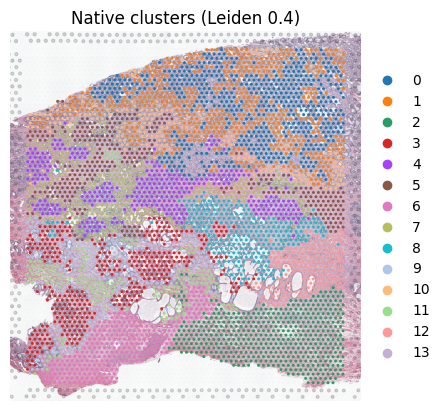

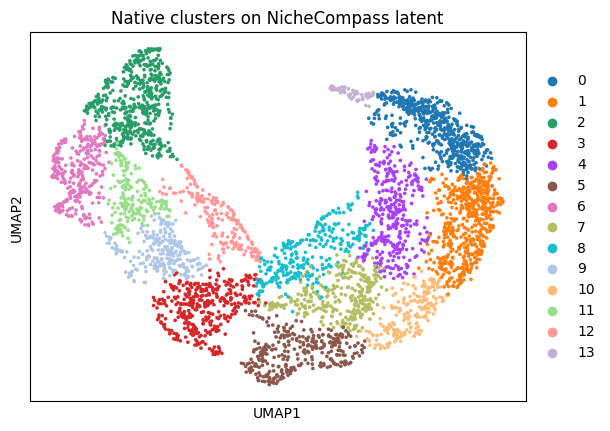

In [ ]:
# ===================== Cell 6 =====================
# =========================================================
# 前置步骤：加载 Step3 保存的结果 (AnnData + 模型)
# =========================================================
import os
import scanpy as sc
# 假设 nichecompass 已正确导入为 nc
import nichecompass as nc 

# -------------------------- 1. 定义加载路径 (与保存路径完全一致) --------------------------
save_base_dir = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My"
file_prefix = "Human_Prostate_Cancer"

# -------------------------- 2. 加载 AnnData 对象 --------------------------
adata_load_path = os.path.join(save_base_dir, f"{file_prefix}.h5ad")
adata_model = sc.read_h5ad(adata_load_path)
print(f"✅ [1/2] AnnData 已从 {adata_load_path} 加载")

# -------------------------- 3. 加载 NicheCompass 模型 --------------------------
model_load_dir = os.path.join(save_base_dir, f"{file_prefix}_model")
# 注意：load 函数需要传入对应的 adata_model 以恢复图结构等信息
model = nc.models.NicheCompass.load(
    dir_path=model_load_dir,
    adata=adata_model
)
print(f"✅ [2/2] NicheCompass 模型已从 {model_load_dir} 加载")

# -------------------------- 4. 恢复/定义关键参数变量 (供后续代码使用) --------------------------
# 这些变量名必须与你训练时的代码保持一致
latent_key = "nichecompass_latent"

# ✅ 修复：动态检查 counts_key，不要硬编码
if "counts" in adata_model.layers:
    counts_key = "counts"
else:
    counts_key = None  # 如果 layers 里没有 counts，就设为 None (使用 .X)
    print("⚠️ 警告: 在 layers 中未找到 'counts'，将默认使用 adata_model.X")

adj_key = "spatial_connectivities"
node_batch_size = 128  # 与训练时保持一致

print("✅ 关键参数变量已恢复，可继续运行后续代码")



# =========================================================
# Step3: 训练后仅查看 NicheCompass 原生聚类结果（无二次划分）
# 直接接在 model.train(...) 后运行
# =========================================================

# 1) 提取 latent（与训练保持同一 counts_key / adj_key）
adata_model.obsm[latent_key] = model.get_latent_representation(
    adata=adata_model,
    counts_key=counts_key,
    adj_key=adj_key,
    node_batch_size=node_batch_size,
)

# 2) 官方教程风格：latent 上建图 + UMAP
sc.pp.neighbors(
    adata_model,
    use_rep=latent_key,
    key_added=latent_key,
    random_state=SEED
)

sc.tl.umap(
    adata_model,
    neighbors_key=latent_key,
    random_state=SEED
)

# 3) 原生聚类（不过度切碎）
native_cluster_key = "latent_leiden_0.6"
sc.tl.leiden(
    adata_model,
    neighbors_key=latent_key,
    key_added=native_cluster_key,
    resolution=0.6,
    random_state=SEED
)


print(f"✅ 原生聚类完成：{adata_model.obs[native_cluster_key].nunique()} 类")

# 4) 仅可视化原生聚类（空间 + UMAP）
sc.pl.spatial(
    adata_model,
    color=native_cluster_key,
    spot_size=170,
    title="Native clusters (Leiden 0.4)",
    frameon=False
)
sc.pl.umap(
    adata_model,
    color=native_cluster_key,
    title="Native clusters on NicheCompass latent"
)



阶段二：数据驱动的自适应阈值与代谢投影 (Data-Driven Projection)
step4——step5
先通过 NicheCompass 基于空间坐标构建组织的物理联通图，无监督学习生成微生态位基础骨架，锁定每个测序 spot 的真实空间邻居关系；
为每条代谢通讯轴计算空间耦合分数，结合 spot 自身的代谢发送能力与周边邻居的接收能力，量化真实的空间通讯潜力；
用高斯混合模型（GMM）为每条轴独立自适应设定活性阈值，分位数法兜底，再基于阈值完成微生态位的精准分型，对过渡区做后续空间拓扑优化；
最终通过分布可视化与空间置换检验，验证结果的生物学真实性与统计稳健性，排除随机噪音干扰。

=== 阶段二: 代谢统计初判 + low_malig_gate spot级过滤版 ===
--> 1. 计算空间加权代谢通讯分数 (Coupling Score)...
--> 2. 学习每条代谢轴的自适应阈值 (GMM / Robust Dynamic)...


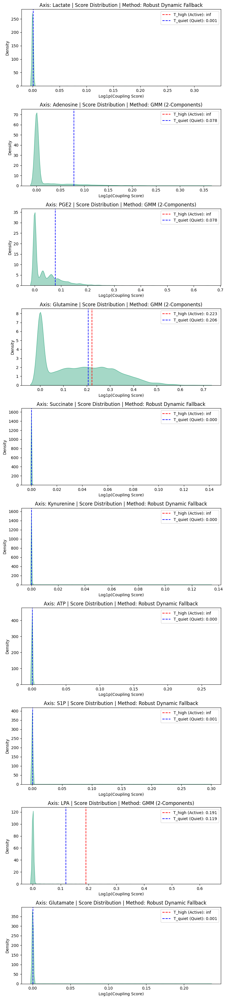


--- 自适应阈值计算结果 ---


,T_high,T_quiet,Method
Lactate,inf,0.001144,Robust Dynamic Fallback
Adenosine,inf,0.078436,GMM (2-Components)
PGE2,inf,0.078463,GMM (2-Components)
Glutamine,0.222684,0.206068,GMM (2-Components)
Succinate,inf,0.000078,Robust Dynamic Fallback
Kynurenine,inf,0.000096,Robust Dynamic Fallback
ATP,inf,0.000434,Robust Dynamic Fallback
S1P,inf,0.000579,Robust Dynamic Fallback
LPA,0.190657,0.119308,GMM (2-Components)
Glutamate,inf,0.000691,Robust Dynamic Fallback


--> 2.5. 构建基于 low_malig_gate 的 spot 保留标记...
✅ malignant列: Malignant
✅ hard_tumor_threshold = 0.7166
✅ low_malig_gate      = 0.5166

--> 3. 先按代谢统计规则，计算初始生态位...

--- 基于超几何富集 + 统计约束的初始生态位判定表（过滤前）---


,Spot_Count,Lactate_Act_Frac,Lactate_FC_Act,Lactate_FDR_Act,Lactate_Intensity_Ratio,Lactate_Pass_All,Adenosine_Act_Frac,Adenosine_FC_Act,Adenosine_FDR_Act,Adenosine_Intensity_Ratio,...,LPA_Intensity_Ratio,LPA_Pass_All,Glutamate_Act_Frac,Glutamate_FC_Act,Glutamate_FDR_Act,Glutamate_Intensity_Ratio,Glutamate_Pass_All,Sig_Active_Axes,Cold_Axis_Count,Initial_Label
Cluster_ID,,,,,,,,,,,,,,,,,,,,,
0,543,0.0,0.0,1.00e+00,0.00,0,0.0,0.0,1.00e+00,1.34,...,0.13,0,0.0,0.0,1.00e+00,0.38,0,Glutamine,9,Single-axis: Glutamine
1,534,0.0,0.0,1.00e+00,0.00,0,0.0,0.0,1.00e+00,1.09,...,0.24,0,0.0,0.0,1.00e+00,0.00,0,None,9,Quiescent (Background)
10,202,0.0,0.0,1.00e+00,0.00,0,0.0,0.0,1.00e+00,1.17,...,0.44,0,0.0,0.0,1.00e+00,0.00,0,None,10,Quiescent (Background)
11,191,0.0,0.0,1.00e+00,1.13,0,0.0,0.0,1.00e+00,0.79,...,1.67,0,0.0,0.0,1.00e+00,3.15,0,None,9,Quiescent (Background)
12,191,0.0,0.0,1.00e+00,0.00,0,0.0,0.0,1.00e+00,0.69,...,0.45,0,0.0,0.0,1.00e+00,2.31,0,None,10,Quiescent (Background)
13,54,0.0,0.0,1.00e+00,0.00,0,0.0,0.0,1.00e+00,1.75,...,0.31,0,0.0,0.0,1.00e+00,0.00,0,Glutamine,9,Single-axis: Glutamine
2,508,0.0,0.0,1.00e+00,0.56,0,0.0,0.0,1.00e+00,0.49,...,1.79,0,0.0,0.0,1.00e+00,0.00,0,None,9,Quiescent (Background)
3,371,0.0,0.0,1.00e+00,1.12,0,0.0,0.0,1.00e+00,1.13,...,2.14,0,0.0,0.0,1.00e+00,4.08,0,Glutamine,8,Single-axis: Glutamine
4,336,0.0,0.0,1.00e+00,0.26,0,0.0,0.0,1.00e+00,1.25,...,0.46,0,0.0,0.0,1.00e+00,2.01,0,Glutamine,9,Single-axis: Glutamine



--> 3.5. 执行 spot 级 low_malig_gate 过滤...

--- low_malig_gate 过滤汇总表 ---


,Cluster_ID,Original_Niche,Original_Spots,Remain_Spots,Removed_Spots,Remain_Fraction,Drop_Whole_Niche
0,0,Single-axis: Glutamine,543,541,2,0.996,0
1,13,Single-axis: Glutamine,54,54,0,1.000,0
2,3,Single-axis: Glutamine,371,20,351,0.054,1
3,4,Single-axis: Glutamine,336,312,24,0.929,0
4,7,Single-axis: Glutamine,297,147,150,0.495,1
5,8,Single-axis: Glutamine,285,126,159,0.442,1


✅ spot级 low_malig_gate 过滤完成。
✅ 不满足 low_malig_gate 的 active niche spot 已移出。
✅ 删除过多、不再构成生态位的区域，已整体改为 Transitional。

--> 4. 绘制过滤前后生态位对比图...


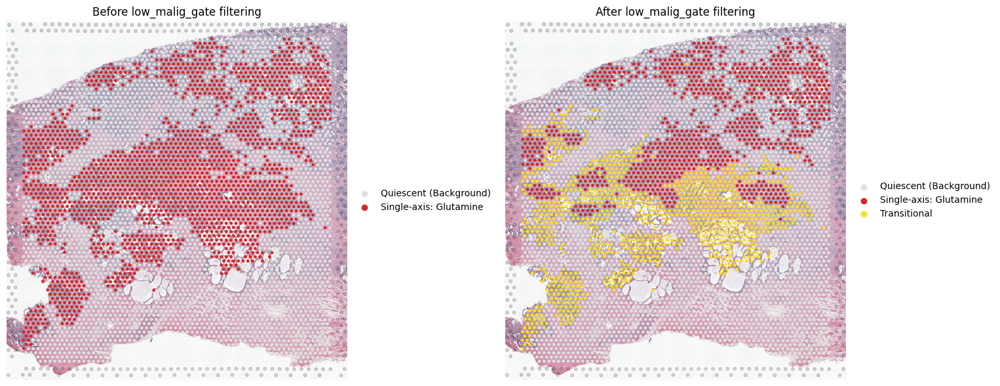

✅ 阶段二执行完毕！
当前 adata_model.obs 中保留了两个关键列：
   1. Niche_Annotation_PreFilter  -> 过滤前初始生态位
   2. Niche_Annotation            -> 经过 low_malig_gate 清洗后的最终生态位


In [ ]:
# =========================================================
# Cell 7: 空间通讯加权分数计算与生态位标注 (阶段二)
# 新逻辑：
# 1. 先按代谢统计规则得到初始生态位
# 2. 再在 active niche 内部，逐个 spot 检查是否满足 low_malig_gate
# 3. 不满足的 spot 从生态位中移出，改成 Transitional
# 4. 如果某个生态位删掉太多，剩下的不再构成生态位，则整体取消
# =========================================================
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
from sklearn.mixture import GaussianMixture
from IPython.display import display
from scipy.stats import hypergeom
from statsmodels.stats.multitest import multipletests

print("=== 阶段二: 代谢统计初判 + low_malig_gate spot级过滤版 ===")

# ---------------------------------------------------------
# Step 4.1: 构建空间感知的连续通讯分数 (Coupling Score)
# ---------------------------------------------------------
print("--> 1. 计算空间加权代谢通讯分数 (Coupling Score)...")
adj_matrix = adata_model.obsp["spatial_connectivities"]

for k in AXES:
    sender_scores = adata_model.obs[f"{k}_Sender_Score"].values
    receiver_scores = adata_model.obs[f"{k}_Receiver_Score"].values

    neighbor_receiver_sum = adj_matrix.dot(receiver_scores)
    raw_coupling = sender_scores * neighbor_receiver_sum

    coupling_score = np.log1p(raw_coupling)
    adata_model.obs[f"Coupling_{k}"] = coupling_score

# ---------------------------------------------------------
# Step 4.2: 自适应混合阈值算法 (GMM + 动态稳健兜底)
# ---------------------------------------------------------
print("--> 2. 学习每条代谢轴的自适应阈值 (GMM / Robust Dynamic)...")
thresholds_dict = {}

fig, axes = plt.subplots(len(AXES), 1, figsize=(8, 3.5 * len(AXES)))
if len(AXES) == 1:
    axes = [axes]

for idx, k in enumerate(AXES):
    scores = adata_model.obs[f"Coupling_{k}"].values
    scores_clean = scores[~np.isnan(scores) & (scores > 0)].reshape(-1, 1)

    t_high, t_quiet = None, None
    method_used = "Robust Dynamic Fallback"

    if len(scores_clean) > 50:
        try:
            gmm = GaussianMixture(n_components=2, random_state=42)
            labels = gmm.fit_predict(scores_clean)

            m0, m1 = gmm.means_[0][0], gmm.means_[1][0]
            s0 = np.sqrt(gmm.covariances_[0][0][0])
            s1 = np.sqrt(gmm.covariances_[1][0][0])

            if abs(m0 - m1) > 0.8 * np.std(scores_clean):
                if m0 > m1:
                    t_high = np.min(scores_clean[labels == 0])
                    t_quiet = m1 + s1
                else:
                    t_high = np.min(scores_clean[labels == 1])
                    t_quiet = m0 + s0
                method_used = "GMM (2-Components)"
        except Exception:
            pass

    if t_high is None:
        mean_val = np.mean(scores)
        std_val = np.std(scores)
        t_high_candidate_1 = mean_val + 1.5 * std_val
        t_high_candidate_2 = np.quantile(scores, 0.95)
        t_high = max(t_high_candidate_1, t_high_candidate_2)
        t_quiet = mean_val

    # 硬基线安全锁
    if t_high < 0.15:
        t_high = np.inf

    thresholds_dict[k] = {
        "T_high": t_high,
        "T_quiet": t_quiet,
        "Method": method_used
    }

    adata_model.obs[f"Active_{k}"] = (scores >= t_high).astype(int)
    adata_model.obs[f"Quiet_{k}"] = (scores <= t_quiet).astype(int)

    sns.kdeplot(scores, ax=axes[idx], fill=True, color="#4CB391", alpha=0.5, bw_adjust=0.5)
    axes[idx].axvline(t_high, color="red", linestyle="--", label=f"T_high (Active): {t_high:.3f}")
    axes[idx].axvline(t_quiet, color="blue", linestyle="--", label=f"T_quiet (Quiet): {t_quiet:.3f}")
    axes[idx].set_title(f"Axis: {k} | Score Distribution | Method: {method_used}")
    axes[idx].set_xlabel("Log1p(Coupling Score)")
    axes[idx].legend()

plt.tight_layout()
plt.show()

df_thresholds = pd.DataFrame(thresholds_dict).T
print("\n--- 自适应阈值计算结果 ---")
display(df_thresholds)

# ---------------------------------------------------------
# Step 4.3: 构建 low_malig_gate 的 spot 过滤标记
# 这里只做 spot 自身检查，不再做 cluster级 tumor support
# ---------------------------------------------------------
print("--> 2.5. 构建基于 low_malig_gate 的 spot 保留标记...")

possible_malig_cols = ["Malignant", "malignant", "Tumor", "tumor", "Cancer", "cancer"]
malig_col = None
for c in possible_malig_cols:
    if c in adata_model.obs.columns:
        malig_col = c
        break

if malig_col is None:
    raise KeyError("❌ 未找到 SpaCET 恶性分数字段，如 'Malignant'。")

# 读取 SpaCET GMM 阈值
gmm_csv = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET/GMM_Optimal_Threshold_Result.csv"
gmm_df = pd.read_csv(gmm_csv)

hard_tumor_threshold = float(
    gmm_df.loc[gmm_df["Metric"] == "Optimal_GMM_Threshold", "Value"].iloc[0]
)

# 你要求的规则：只看 low_malig_gate
low_malig_gate = max(0.0, hard_tumor_threshold - 0.20)

print(f"✅ malignant列: {malig_col}")
print(f"✅ hard_tumor_threshold = {hard_tumor_threshold:.4f}")
print(f"✅ low_malig_gate      = {low_malig_gate:.4f}")

malig_values = adata_model.obs[malig_col].astype(float).values
adata_model.obs["Keep_By_LowMalig"] = (malig_values >= low_malig_gate).astype(int)

# ---------------------------------------------------------
# Step 5: 先按代谢统计规则，得到“初始生态位”
# 此时还不做 low_malig_gate spot删除
# ---------------------------------------------------------
print("\n--> 3. 先按代谢统计规则，计算初始生态位...")

M_global = adata_model.n_obs
bg_active_counts = {k: int(adata_model.obs[f"Active_{k}"].sum()) for k in AXES}
bg_quiet_counts = {k: int(adata_model.obs[f"Quiet_{k}"].sum()) for k in AXES}

bg_active_fracs = {k: bg_active_counts[k] / M_global for k in AXES}
bg_quiet_fracs = {k: bg_quiet_counts[k] / M_global for k in AXES}

native_clusters = sorted(adata_model.obs[native_cluster_key].unique())
pvals_active_dict = {k: [] for k in AXES}
pvals_quiet_dict = {k: [] for k in AXES}

for k in AXES:
    adata_model.obs[f"{k}_Cluster_Active_Frac"] = 0.0

for c in native_clusters:
    c_mask = adata_model.obs[native_cluster_key] == c
    N_cluster = int(c_mask.sum())

    for k in AXES:
        k_obs_act = int(adata_model.obs.loc[c_mask, f"Active_{k}"].sum())
        k_obs_qui = int(adata_model.obs.loc[c_mask, f"Quiet_{k}"].sum())

        act_frac = k_obs_act / N_cluster if N_cluster > 0 else 0.0
        adata_model.obs.loc[c_mask, f"{k}_Cluster_Active_Frac"] = act_frac

        pval_a = hypergeom.sf(k_obs_act - 1, M_global, bg_active_counts[k], N_cluster) if k_obs_act > 0 else 1.0
        pval_q = hypergeom.sf(k_obs_qui - 1, M_global, bg_quiet_counts[k], N_cluster) if k_obs_qui > 0 else 1.0

        pvals_active_dict[k].append(pval_a)
        pvals_quiet_dict[k].append(pval_q)

fdr_active_dict = {}
fdr_quiet_dict = {}
for k in AXES:
    _, fdr_a, _, _ = multipletests(pvals_active_dict[k], method="fdr_bh")
    _, fdr_q, _, _ = multipletests(pvals_quiet_dict[k], method="fdr_bh")
    fdr_active_dict[k] = fdr_a
    fdr_quiet_dict[k] = fdr_q

# ==========================================
# 4. 初始生态位判定（过滤前）
# ==========================================
cluster_annotations = {}
cluster_stats = []

MIN_FC = 1.30
MIN_ACTIVE_SPOTS = 10
MIN_INTENSITY_RATIO = 1.20
QUIESCENT_COLD_AXIS_NUM = 6

global_mean_scores = {k: adata_model.obs[f"Coupling_{k}"].mean() for k in AXES}

for idx, c in enumerate(native_clusters):
    c_mask = adata_model.obs[native_cluster_key] == c
    N_cluster = int(c_mask.sum())

    sig_active_axes = []
    cold_axes = []

    stat_row = {
        "Cluster_ID": c,
        "Spot_Count": N_cluster
    }

    for k in AXES:
        act_frac = float(adata_model.obs.loc[c_mask, f"{k}_Cluster_Active_Frac"].iloc[0])
        qui_frac = float(adata_model.obs.loc[c_mask, f"Quiet_{k}"].sum() / N_cluster) if N_cluster > 0 else 0.0
        k_obs_act = int(adata_model.obs.loc[c_mask, f"Active_{k}"].sum())
        cluster_mean_score = float(adata_model.obs.loc[c_mask, f"Coupling_{k}"].mean())

        fc_act = act_frac / (bg_active_fracs[k] + 1e-9)
        fdr_a = float(fdr_active_dict[k][idx])
        intensity_ratio = cluster_mean_score / (global_mean_scores[k] + 1e-9)

        pass_ratio = fc_act >= MIN_FC
        pass_count = k_obs_act >= MIN_ACTIVE_SPOTS
        pass_intensity = intensity_ratio >= MIN_INTENSITY_RATIO
        pass_fdr = fdr_a < 0.05

        # 初始生态位只看代谢统计条件
        if pass_ratio and pass_count and pass_intensity and pass_fdr:
            sig_active_axes.append(k)

        if qui_frac > bg_quiet_fracs[k] or fc_act < 0.5:
            cold_axes.append(k)

        stat_row[f"{k}_Act_Frac"] = round(act_frac, 3)
        stat_row[f"{k}_FC_Act"] = round(fc_act, 2)
        stat_row[f"{k}_FDR_Act"] = f"{fdr_a:.2e}"
        stat_row[f"{k}_Intensity_Ratio"] = round(intensity_ratio, 2)
        stat_row[f"{k}_Pass_All"] = int(pass_ratio and pass_count and pass_intensity and pass_fdr)

    if len(sig_active_axes) == 0 and len(cold_axes) >= QUIESCENT_COLD_AXIS_NUM:
        c_label = "Quiescent (Background)"
    elif len(sig_active_axes) == 1:
        c_label = f"Single-axis: {sig_active_axes[0]}"
    elif len(sig_active_axes) >= 2:
        c_label = f"Multi-axis: {'_'.join(sig_active_axes)}"
    else:
        c_label = "Transitional"

    cluster_annotations[c] = c_label
    stat_row["Sig_Active_Axes"] = ",".join(sig_active_axes) if len(sig_active_axes) > 0 else "None"
    stat_row["Cold_Axis_Count"] = len(cold_axes)
    stat_row["Initial_Label"] = c_label
    cluster_stats.append(stat_row)

# 先保存“过滤前”的初始生态位
adata_model.obs["Niche_Annotation_PreFilter"] = (
    adata_model.obs[native_cluster_key].map(cluster_annotations).astype(str)
)

df_cluster_stats = pd.DataFrame(cluster_stats).set_index("Cluster_ID")
print("\n--- 基于超几何富集 + 统计约束的初始生态位判定表（过滤前）---")
display(df_cluster_stats)

# ---------------------------------------------------------
# Step 5.5: spot级别 low_malig_gate 过滤
# 规则：
# 1. 只检查 Single-axis / Multi-axis 这两类 active niche
# 2. 不满足 low_malig_gate 的 spot，移出生态位，改成 Transitional
# 3. 如果一个生态位删掉太多，剩下太少，就整个取消
# ---------------------------------------------------------
print("\n--> 3.5. 执行 spot 级 low_malig_gate 过滤...")

# 从过滤前标签复制出过滤后标签
adata_model.obs["Niche_Annotation"] = adata_model.obs["Niche_Annotation_PreFilter"].astype(str)

# 只对 active niche 做过滤
is_active_niche = (
    adata_model.obs["Niche_Annotation"].str.startswith("Single-axis:") |
    adata_model.obs["Niche_Annotation"].str.startswith("Multi-axis:")
)

# 在 active niche 中，不满足 low_malig_gate 的 spot -> 改成 Transitional
bad_spot_mask = is_active_niche & (adata_model.obs["Keep_By_LowMalig"] == 0)
adata_model.obs.loc[bad_spot_mask, "Niche_Annotation"] = "Transitional"

# 再检查：某个生态位如果删掉太多，则整体取消
MIN_REMAIN_SPOTS_AFTER_FILTER = 10
MIN_REMAIN_FRAC_AFTER_FILTER = 0.50

filter_summary = []

for c in native_clusters:
    c_mask = adata_model.obs[native_cluster_key] == c

    pre_labels = adata_model.obs.loc[c_mask, "Niche_Annotation_PreFilter"].unique().tolist()
    active_pre_labels = [
        x for x in pre_labels
        if str(x).startswith("Single-axis:") or str(x).startswith("Multi-axis:")
    ]

    for label in active_pre_labels:
        original_mask = c_mask & (adata_model.obs["Niche_Annotation_PreFilter"] == label)
        remain_mask = c_mask & (adata_model.obs["Niche_Annotation"] == label)

        original_n = int(original_mask.sum())
        remain_n = int(remain_mask.sum())
        removed_n = original_n - remain_n
        remain_frac = remain_n / original_n if original_n > 0 else 0.0

        drop_whole_niche = (
            (remain_n < MIN_REMAIN_SPOTS_AFTER_FILTER) or
            (remain_frac < MIN_REMAIN_FRAC_AFTER_FILTER)
        )

        if drop_whole_niche:
            adata_model.obs.loc[original_mask, "Niche_Annotation"] = "Transitional"

        filter_summary.append({
            "Cluster_ID": c,
            "Original_Niche": label,
            "Original_Spots": original_n,
            "Remain_Spots": remain_n,
            "Removed_Spots": removed_n,
            "Remain_Fraction": round(remain_frac, 3),
            "Drop_Whole_Niche": int(drop_whole_niche)
        })

# 转回 category
adata_model.obs["Niche_Annotation"] = adata_model.obs["Niche_Annotation"].astype("category")

df_filter_summary = pd.DataFrame(filter_summary)
print("\n--- low_malig_gate 过滤汇总表 ---")
display(df_filter_summary)

print("✅ spot级 low_malig_gate 过滤完成。")
print("✅ 不满足 low_malig_gate 的 active niche spot 已移出。")
print("✅ 删除过多、不再构成生态位的区域，已整体改为 Transitional。")

# ---------------------------------------------------------
# 可视化: 过滤前 / 过滤后 对比
# ---------------------------------------------------------
print("\n--> 4. 绘制过滤前后生态位对比图...")

color_list = [
    "#d62728", "#1f77b4", "#2ca02c", "#ff7f0e", "#9467bd",
    "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
    "#ff9896", "#aec7e8", "#98df8a", "#ffbb78", "#c5b0d5",
    "#c49c94", "#f7b6d2", "#c7c7c7", "#dbdb8d", "#9edae5"
]

def build_palette(categories):
    palette = {}
    color_idx = 0
    for cat in categories:
        cat = str(cat)
        if "Quiescent" in cat:
            palette[cat] = "#e0e0e0"
        elif "Transitional" in cat:
            palette[cat] = "#ffe119"
        else:
            palette[cat] = color_list[color_idx % len(color_list)]
            color_idx += 1
    return palette

pre_categories = pd.Series(adata_model.obs["Niche_Annotation_PreFilter"].astype(str)).unique().tolist()
post_categories = adata_model.obs["Niche_Annotation"].astype(str).unique().tolist()

pre_palette = build_palette(pre_categories)
post_palette = build_palette(post_categories)

fig, axs = plt.subplots(1, 2, figsize=(16, 6))

sc.pl.spatial(
    adata_model,
    color="Niche_Annotation_PreFilter",
    size=1,
    title="Before low_malig_gate filtering",
    frameon=False,
    palette=pre_palette,
    ax=axs[0],
    show=False
)

sc.pl.spatial(
    adata_model,
    color="Niche_Annotation",
    size=1,
    title="After low_malig_gate filtering",
    frameon=False,
    palette=post_palette,
    ax=axs[1],
    show=False
)

plt.tight_layout()
plt.show()

print("✅ 阶段二执行完毕！")
print("当前 adata_model.obs 中保留了两个关键列：")
print("   1. Niche_Annotation_PreFilter  -> 过滤前初始生态位")
print("   2. Niche_Annotation            -> 经过 low_malig_gate 清洗后的最终生态位")

可视化每个代谢轴的空间代谢通讯潜力图


=== 附加分析: 生成十种代谢物空间代谢通讯潜力图 ===
注: 采用 Coupling_Score (Sender * 邻居Receiver) 作为有效代谢物浓度与作用场的推断指标


✅ 图片已保存至：/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My/10_metabolites_concentration_gradient.png


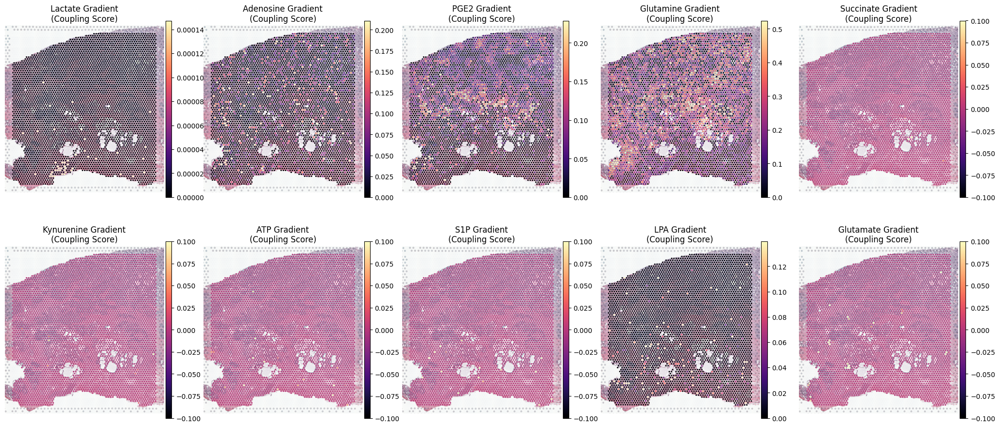

✅ 10 种代谢物的空间代谢通讯潜力图绘制完毕！


In [ ]:
# =========================================================
# Cell 8: 绘制 10 种代谢物的空间代谢通讯潜力图 (连续分布)
# =========================================================
import matplotlib.pyplot as plt
import scanpy as sc
import os  # 新增：用于文件路径操作

print("=== 附加分析: 生成十种代谢物空间代谢通讯潜力图 ===")
print("注: 采用 Coupling_Score (Sender * 邻居Receiver) 作为有效代谢物浓度与作用场的推断指标")

# ===================== 新增：定义图片保存路径 =====================
# 你指定的保存根目录
save_root_path = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My"
# 自动创建目录（不存在则创建，存在不报错）
os.makedirs(save_root_path, exist_ok=True)
# 完整保存文件路径（命名为10种代谢物空间代谢通讯潜力图）
save_image_path = os.path.join(save_root_path, "10_metabolites_concentration_gradient.png")
# =================================================================

# 1. 获取需要绘制的列名 (Coupling_Score 已经在上一步取了 log1p，非常适合梯度可视化)
gradient_columns = [f"Coupling_{k}" for k in AXES]

# 2. 为每张图设置好标题
plot_titles =[f"{k} Gradient\n(Coupling Score)" for k in AXES]

# 3. 设置绘图参数
# 使用 'magma' 或 'inferno' 色系，这种暗底亮色的色谱非常适合展示类似“荧光染色”的浓度梯度
cmap_choice = "magma" 

# 4. 利用 scanpy 自带的多图排列功能绘制
sc.pl.spatial(
    adata_model,
    color=gradient_columns,
    cmap=cmap_choice,
    size=1,              # 保持与你前面一致的 spot 大小
    ncols=5,             # 每行放 5 张图，10 个轴正好 2 行
    frameon=False,       # 去掉坐标轴边框，更美观
    title=plot_titles,
    vmin=0,              # 浓度最低为 0
    vmax='p99',          # 截断最高 1% 的极端离群值，让主体梯度颜色更丰富
    show=False           # 先不显示，稍后通过 plt.show() 统一控制
)

# 调整子图间距并展示
plt.subplots_adjust(wspace=0.1, hspace=0.2)
fig = plt.gcf()
fig.set_size_inches(25, 10) # 设置大画布，保证高分辨率

# ===================== 新增：保存图片（必须在 plt.show() 之前！） =====================
# dpi=300：高分辨率；bbox_inches='tight'：裁剪多余白边；pad_inches=0.1：轻微内边距
plt.savefig(save_image_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
print(f"✅ 图片已保存至：{save_image_path}")
# ====================================================================================

plt.show()

print("✅ 10 种代谢物的空间代谢通讯潜力图绘制完毕！")

阶段三  空间拓扑图剪枝与重塑 (Spatial Refinement: Split, Merge & Smooth)


--> 4. 规范化命名并绘制最终 TMCN 地图...
✅ Final_Niche_Type 已生成
当前类别： ['TMCN_Glutamine_Axis', 'TMCN_Quiescent', 'TMCN_Transitional']


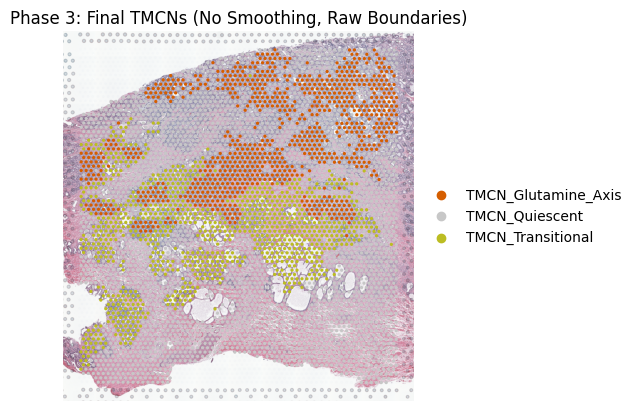

✅ 阶段三执行完毕！结果保存至: /home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My/Human_Prostate_Cancer_annotated.h5ad
✅ 保存后检查列是否存在： True
✅ 当前保存文件中的相关列： ['Niche_Annotation', 'Final_Niche_Type']


In [ ]:
# =========================================================
# Cell 9：名称规范化（不平滑、不改边界）【与当前 Cell 10 完全对齐版】
# =========================================================
print("\n--> 4. 规范化命名并绘制最终 TMCN 地图...")

import os
import scanpy as sc
import seaborn as sns

# 如果之前有旧列，先删掉，避免历史结果污染
if "Final_Niche_Type" in adata_model.obs.columns:
    adata_model.obs.drop(columns=["Final_Niche_Type"], inplace=True)

# 必须先有 Cell 7 生成的 Niche_Annotation
if "Niche_Annotation" not in adata_model.obs.columns:
    raise KeyError("❌ 未找到 Niche_Annotation。请先运行 Cell 7。")

def map_niche_name(raw_name):
    raw_name = str(raw_name)

    if raw_name.startswith("Single-axis:"):
        axis = raw_name.split(": ")[1].strip()
        return f"TMCN_{axis}_Axis"

    elif raw_name.startswith("Multi-axis:"):
        axes_str = raw_name.split(": ")[1].strip()
        return f"Multi_Axis_{axes_str}"

    elif raw_name.startswith("Quiescent"):
        return "TMCN_Quiescent"

    else:
        return "TMCN_Transitional"

# 用 Cell 7 的输出生成 Final_Niche_Type
adata_model.obs["Final_Niche_Type"] = (
    adata_model.obs["Niche_Annotation"]
    .astype(str)
    .apply(map_niche_name)
    .astype("category")
)

print("✅ Final_Niche_Type 已生成")
print("当前类别：", adata_model.obs["Final_Niche_Type"].cat.categories.tolist())

# 配色
base_palette = {
    "TMCN_Quiescent": "#c7c7c7",
    "TMCN_Transitional": "#bcbd22"
}

single_axis_colors = sns.color_palette("colorblind", n_colors=len(AXES)).as_hex()
single_axis_palette = {
    f"TMCN_{axis}_Axis": single_axis_colors[i % len(single_axis_colors)]
    for i, axis in enumerate(AXES)
}

multi_colors = ["#8c564b", "#8b008b", "#008080", "#ff1493",
                "#000080", "#ff8c00", "#4682b4", "#556b2f"]

active_palette = {}
c_idx = 0

for cat in adata_model.obs["Final_Niche_Type"].cat.categories:
    if cat in single_axis_palette:
        active_palette[cat] = single_axis_palette[cat]
    elif cat in base_palette:
        active_palette[cat] = base_palette[cat]
    elif "Multi_Axis" in cat:
        active_palette[cat] = multi_colors[c_idx % len(multi_colors)]
        c_idx += 1
    else:
        active_palette[cat] = "#9467bd"

sc.pl.spatial(
    adata_model,
    color="Final_Niche_Type",
    size=1,
    title="Phase 3: Final TMCNs (No Smoothing, Raw Boundaries)",
    frameon=False,
    palette=active_palette,
    legend_loc="right margin",
    show=True
)
# /home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My/Human_Prostate_Cancer_annotated
# ⚠️ 这里必须改成和当前 Cell 10 完全一致的路径
save_base_dir = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My"
file_prefix = "Human_Prostate_Cancer_annotated"

os.makedirs(save_base_dir, exist_ok=True)
adata_save_path = os.path.join(save_base_dir, f"{file_prefix}.h5ad")
adata_model.write(adata_save_path)

print(f"✅ 阶段三执行完毕！结果保存至: {adata_save_path}")

# 保险检查
adata_check = sc.read_h5ad(adata_save_path)
print("✅ 保存后检查列是否存在：", "Final_Niche_Type" in adata_check.obs.columns)
print("✅ 当前保存文件中的相关列：", [c for c in adata_check.obs.columns if c in ["Niche_Annotation", "Final_Niche_Type"]])

结合SpaCET和我的结果
我现在有了我自己计算的Final_Niche_Type标签的结果和SpaCET得出的肿瘤非肿瘤区域划分标签结果，现在要把他们两个结合一下。
1、将SpaCET的Predicted_Tumor标签结果和我的非TMCN_Quiescent结果全都保留，合并到一起，这是一个肿瘤区域，其余区域，也就是将将SpaCET的Predicted_Non_Tumor标签结果和我的TMCN_Quiescent结果合并到一起形成一个Healthy非肿瘤区域。

2、在肿瘤区域中，将我的Final_Niche_Type标签中是单个代谢轴或者多个代谢轴的区域还是各自单独一个肿瘤标签（还是使用我的Final_Niche_Type标签的结果），将SpaCET的Predicted_Tumor标签结果和我得出的TMCN_Quiescent结果视作TMCN_Quiescent区域。

=== 阶段四: 跨模态标签联合 (Macro-Micro Hierarchical Niche) ===
--> 1. 正在加载并对齐数据...


    [对齐完成] 成功导入 SpaCET 预测标签: Unsupervised_Pred_0.72
--> 2. 正在执行宏观-微观联合推断逻辑...
    [逻辑应用完毕] 成功生成 Level1_Macro_Region 与 Level2_Micro_Niche (已将肿瘤内过渡区并入休眠区)。
    [逻辑应用完毕] 成功生成 Level1_Macro_Region 与 Level2_Micro_Niche。
--> 3. 正在生成最终层级空间生态位地图...


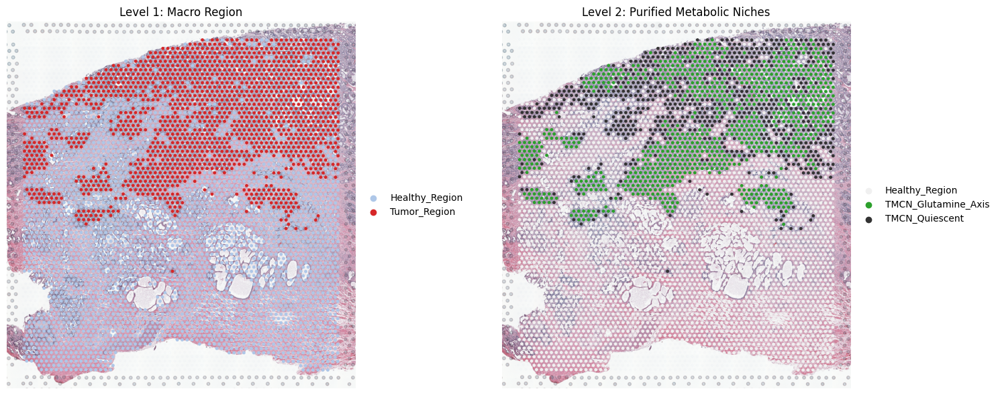


--> 4. 正在计算最终详细生态位的代谢轴高活性 Spot 比例...
✅ 各代谢轴突破高活性阈值的 spot 比例已保存至: 
   /home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My/Level2_Micro_Niche_Active_Fractions.csv

--> 5. 正在精简 adata.obs 冗余中间特征，提取纯净版结果...
    [精简完成] 共移除了 65 个生化推断中间列。

🎉 终极纯净版数据已成功覆盖保存至原始文件:
   /home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My/Human_Prostate_Cancer_annotated.h5ad
📌 该最终 h5ad 文件的 adata.obs 中保留的列严格符合你的要求：
  1. 原始基础列及病理注释
  2. SpaCET 反卷积的所有细胞成分分数 (被永远合并在内了)
  3. 最终简略版生态位: 'Level1_Macro_Region' (Tumor/Healthy)
  4. 最终详细版生态位: 'Level2_Micro_Niche' (单轴/多轴/休眠等)


In [ ]:
# =========================================================
# Cell 10: 跨模态标签对齐与最终层级生态位构建 (SpaCET + NicheCompass)
# =========================================================
import anndata as ad
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os

print("=== 阶段四: 跨模态标签联合 (Macro-Micro Hierarchical Niche) ===")

# ==========================================
# 1. 路径配置 (读取数据与设置输出)
# ==========================================
# 你的 NicheCompass 最终产物 (也就是我们要覆盖保存的原始文件)
path_h5ad_niche = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My/Human_Prostate_Cancer_annotated.h5ad"

# 你上一步保存的 SpaCET GMM 预测结果 CSV
path_spacet_csv = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET/GMM_Tumor_NonTumor_Pred_Labels.csv"

# 指定输出文件夹（自动创建，用于存CSV和图片）
SAVE_DIR = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/Human_Prostate_Cancer/SpaCET_And_My"
os.makedirs(SAVE_DIR, exist_ok=True)

# ==========================================
# 2. 读取并合并数据
# ==========================================
print("--> 1. 正在加载并对齐数据...")
adata = ad.read_h5ad(path_h5ad_niche)
spacet_df = pd.read_csv(path_spacet_csv, index_col=0)

# 动态获取 GMM 预测的那一列的名字 (例如 'Unsupervised_Pred_0.45')
spacet_pred_col = [c for c in spacet_df.columns if c.startswith('Unsupervised_Pred_')][0]

# 合并到 adata.obs (利用索引自动对齐)
adata.obs = adata.obs.join(spacet_df[[spacet_pred_col]])
print(f"    [对齐完成] 成功导入 SpaCET 预测标签: {spacet_pred_col}")

# ==========================================
# 3. 严格执行核心合并规则 (并集逻辑)
# ==========================================
print("--> 2. 正在执行宏观-微观联合推断逻辑...")

# 初始化新列，默认全为健康区域
adata.obs['Level1_Macro_Region'] = 'Healthy_Region'
adata.obs['Level2_Micro_Niche'] = 'Healthy_Region'

# 提取关键判断条件
is_spacet_tumor = adata.obs[spacet_pred_col] == 'Predicted_Tumor'
is_niche_quiescent = adata.obs['Final_Niche_Type'] == 'TMCN_Quiescent'
# 新增：判断是否为过渡态
is_niche_transitional = adata.obs['Final_Niche_Type'] == 'TMCN_Transitional'


# ----------------- 规则 1: Level 1 (Tumor vs Healthy) ✅ 已修改 -----------------
# 【你的新需求】SpaCET预测为肿瘤  OR  (微环境不是休眠态 且 不是过渡态) → 肿瘤区域
tumor_mask = is_spacet_tumor | ( (~is_niche_quiescent) & (~is_niche_transitional) )
adata.obs.loc[tumor_mask, 'Level1_Macro_Region'] = 'Tumor_Region'



# ----------------- 规则 2: Level 2 (微型代谢生态位) -----------------
# 🔥 核心修复：强制转为普通字符串(str)，打破 Categorical 字典的限制
final_niche_str = adata.obs['Final_Niche_Type'].astype(str)

# 重新定义目标掩码：包含 Quiescent (休眠) 或 Transitional (过渡态)
is_quiescent_or_transitional = (final_niche_str == 'TMCN_Quiescent') | (final_niche_str == 'TMCN_Transitional')

# 1. 真正活跃的代谢区 (排除了休眠和过渡态)：直接保留其详细的多轴/单轴名称
active_niche_mask = ~is_quiescent_or_transitional
adata.obs.loc[active_niche_mask, 'Level2_Micro_Niche'] = final_niche_str[active_niche_mask]

# 2. 【你的新逻辑】将 SpaCET 预测为 Tumor 且 代谢状态为 Quiescent 或 Transitional 的区域，统一视作 TMCN_Quiescent (代谢耗竭/坏死核心)
target_tumor_mask = is_spacet_tumor & is_quiescent_or_transitional
adata.obs.loc[target_tumor_mask, 'Level2_Micro_Niche'] = 'TMCN_Quiescent'

# 🔥 写入完成后，为了方便后续 Scanpy 画图，重新将这列转换回 Category 格式
adata.obs['Level2_Micro_Niche'] = adata.obs['Level2_Micro_Niche'].astype('category')

print("    [逻辑应用完毕] 成功生成 Level1_Macro_Region 与 Level2_Micro_Niche (已将肿瘤内过渡区并入休眠区)。")



# 2. 将 SpaCET 预测为 Tumor 且 你的结果为 TMCN_Quiescent 的区域，视作 TMCN_Quiescent
quiescent_tumor_mask = is_spacet_tumor & is_niche_quiescent
adata.obs.loc[quiescent_tumor_mask, 'Level2_Micro_Niche'] = 'TMCN_Quiescent'

print("    [逻辑应用完毕] 成功生成 Level1_Macro_Region 与 Level2_Micro_Niche。")

# ==========================================
# 4. 可视化检查
# ==========================================
print("--> 3. 正在生成最终层级空间生态位地图...")

macro_palette = {
    "Tumor_Region": "#d62728",    
    "Healthy_Region": "#aec7e8"   
}

base_micro_palette = {
    "TMCN_Lactate_Axis": "#d62728",        
    "TMCN_Adenosine_Axis": "#1f77b4",      
    "TMCN_PGE2_Axis": "#ff7f0e",           
    "TMCN_Glutamine_Axis": "#2ca02c",      
    "TMCN_Succinate_Axis": "#9467bd",      
    "TMCN_Kynurenine_Axis": "#e377c2",     
    "TMCN_ATP_Axis": "#17becf",            
    "TMCN_S1P_Axis": "#7f7f7f",            
    "TMCN_LPA_Axis": "#ff9896",            
    "TMCN_Glutamate_Axis": "#fada5e",      
    "TMCN_Transitional": "#bcbd22",
    "TMCN_Quiescent": "#333333",           
    "Healthy_Region": "#f0f0f0"            
}

multi_axis_colors = ["#8c564b", "#8b008b", "#008080", "#ff1493", "#000080", "#ff8c00", "#4682b4", "#556b2f"]

active_macro_colors = {k: macro_palette[k] for k in adata.obs['Level1_Macro_Region'].unique()}

active_micro_colors = {}
color_idx = 0
for cat in adata.obs['Level2_Micro_Niche'].unique():
    if cat in base_micro_palette:
        active_micro_colors[cat] = base_micro_palette[cat]
    elif "Multi_Axis" in cat:
        active_micro_colors[cat] = multi_axis_colors[color_idx % len(multi_axis_colors)]
        color_idx += 1
    else:
        active_micro_colors[cat] = "#000000"

fig, axs = plt.subplots(1, 2, figsize=(16, 6))
sc.pl.spatial(adata, color='Level1_Macro_Region', size=1, title="Level 1: Macro Region", 
              palette=active_macro_colors, frameon=False, ax=axs[0], show=False)
sc.pl.spatial(adata, color='Level2_Micro_Niche', size=1, title="Level 2: Purified Metabolic Niches", 
              palette=active_micro_colors, frameon=False, ax=axs[1], show=False)
plt.tight_layout()
plt.show()

# ==========================================
# 5. 提取并保存：最终详细生态位 (Level 2) 各代谢轴高活性比例
# ==========================================
print("\n--> 4. 正在计算最终详细生态位的代谢轴高活性 Spot 比例...")

axes_active_cols = [c for c in adata.obs.columns if c.startswith("Active_")]
active_frac_df = adata.obs.groupby('Level2_Micro_Niche')[axes_active_cols].mean().reset_index()

rename_map = {c: c.replace("Active_", "active_fraction_") for c in axes_active_cols}
active_frac_df.rename(columns=rename_map, inplace=True)
active_frac_df.rename(columns={'Level2_Micro_Niche': 'Micro_Niche_Cluster'}, inplace=True)

fraction_csv_path = os.path.join(SAVE_DIR, "Level2_Micro_Niche_Active_Fractions.csv")
active_frac_df.to_csv(fraction_csv_path, index=False)
print(f"✅ 各代谢轴突破高活性阈值的 spot 比例已保存至: \n   {fraction_csv_path}")

# ==========================================
# 6. 精简 h5ad 文件，只保留目标核心列
# ==========================================
print("\n--> 5. 正在精简 adata.obs 冗余中间特征，提取纯净版结果...")

drop_keywords = [
    "Sender_Score", "Receiver_Score", "Coupling_", "Active_", "Quiet_", 
    "Cluster_Active_Frac", "nichecompass_", "latent_leiden", 
    "Pred_Threshold_", "Unsupervised_Pred_", "Niche_Annotation", 
    "Niche_Type", "Final_Niche_Type", "Ground_Truth"
]

cols_to_drop = []
for c in adata.obs.columns:
    if any(k in c for k in drop_keywords):
        cols_to_drop.append(c)

adata.obs.drop(columns=cols_to_drop, inplace=True, errors='ignore')
print(f"    [精简完成] 共移除了 {len(cols_to_drop)} 个生化推断中间列。")

# ==========================================
# 7. 【关键修改】覆盖保存回原 h5ad 文件
# ==========================================
# 直接使用开头加载的 path_h5ad_niche，不新建文件
adata.write_h5ad(path_h5ad_niche)

print(f"\n🎉 终极纯净版数据已成功覆盖保存至原始文件:\n   {path_h5ad_niche}")
print("======================================================")
print("📌 该最终 h5ad 文件的 adata.obs 中保留的列严格符合你的要求：")
print("  1. 原始基础列及病理注释")
print("  2. SpaCET 反卷积的所有细胞成分分数 (被永远合并在内了)")
print("  3. 最终简略版生态位: 'Level1_Macro_Region' (Tumor/Healthy)")
print("  4. 最终详细版生态位: 'Level2_Micro_Niche' (单轴/多轴/休眠等)")
print("======================================================")

计算ARI

In [ ]:
# =========================================================
# Cell 11: 顶级生信学者专属 - 空间多维全栈指标综合评估
# 涵盖宏观物理边界 (ARI, F1) + 微观特征纯度 (ASW, SS-C, DBI) + 空间物理聚集度 (Moran's I)
# =========================================================
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import os
import warnings
from sklearn.metrics import (
    adjusted_rand_score, 
    f1_score, 
    silhouette_score, 
    silhouette_samples, 
    davies_bouldin_score
)

warnings.filterwarnings("ignore")

print("="*60)
print("🚀 开始执行全维度空间与特征指标综合评估...")
print("="*60)

# 1. 加载数据 (假设直接使用你内存中的 adata，或者重新读取)
# 如果你是接在 Cell 11 后面运行，此时内存中已经有 adata。如果需要重新读取，请取消注释下一行：
# path_h5ad = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/colorectal_12_cancer_CRC/SN048_A121573_Rep1/SpaCET_And_My/SN048_A121573_Rep1_NicheCompassAndmy_Final.h5ad"
# adata = sc.read_h5ad(path_h5ad)

# =========================================================
# 模块一：宏观边界评估 (Supervised: ARI, F1)
# =========================================================
print("\n🟢 [1/3] 正在计算宏观监督指标 (Invasive vs Others)...")

# 1. 自动获取所有唯一的病理标签，以构建“非肿瘤”映射
all_pathology_labels = adata.obs['Pathology_Annotation'].unique()

# 2. 构建映射字典：仅 Invasive carcinoma 为 1，其余所有均为 0
# 使用字典推导式确保覆盖所有“其它区域”
gt_map = {label: (1 if label == 'Invasive carcinoma' else 0) for label in all_pathology_labels if pd.notna(label)}

# 你在步骤 10 中生成的宏观预测区域
pred_map = {
    'Tumor_Region': 1.0,
    'Healthy_Region': 0.0
}

# 提取真实标签并映射 (使用新列名 Pathology_Annotation)
gt_raw = adata.obs['Pathology_Annotation'].map(gt_map).astype(float).values
# 提取预测标签并映射 (防呆设计：遇到无法映射的值给 NaN，而不是默认填 1.0)
pred_raw = adata.obs['Level1_Macro_Region'].map(pred_map).astype(float).values

# 过滤掉注释为 NaN 的背景点
valid_mask = (~np.isnan(gt_raw)) & (~np.isnan(pred_raw))
y_true = gt_raw[valid_mask]
y_pred = pred_raw[valid_mask]

# 🚨 安全锁：检查是否为空
if len(y_true) == 0:
    available_labels = adata.obs['Pathology_Annotation'].dropna().unique()
    raise ValueError(f"❌ 严重错误：未发现有效 Spot！请检查 'Pathology_Annotation' 列中是否存在 'Invasive carcinoma'。\n当前列中包含的标签有: {available_labels}")
else:
    num_tumor = np.sum(y_true == 1)
    num_normal = np.sum(y_true == 0)
    print(f"  --> 参与宏观评估的有效 Spot 总数: {len(y_true)} (其中肿瘤靶点: {int(num_tumor)}, 其它区域: {int(num_normal)})")

# 计算 ARI 和 F1
ari_val = adjusted_rand_score(y_true, y_pred)
f1_val = f1_score(y_true, y_pred, pos_label=1.0, average='binary')

print(f"  --> Adjusted Rand Index (ARI): {ari_val:.4f}")
print(f"  --> F1-Score (Invasive Region): {f1_val:.4f}")

# =========================================================
# 模块二：微观特征纯度评估 (Unsupervised: ASW, SS-C, DBI)
# =========================================================
print("\n🔵 [2/3] 正在计算微观特征纯度指标 (Level 2 内部逻辑自洽)...")

# 寻找合适的底层特征矩阵 X
if 'nichecompass_latent' in adata.obsm:
    X_features = adata.obsm['nichecompass_latent']
    print("  --> 使用 NicheCompass Latent 空间作为特征矩阵。")
else:
    print("  --> 未发现 Latent 矩阵，自动降维原始基因表达谱 (PCA) 作为公平特征对照...")
    if 'X_pca' not in adata.obsm:
        sc.pp.normalize_total(adata, target_sum=1e4)
        sc.pp.log1p(adata)
        sc.tl.pca(adata, svd_solver='arpack')
    X_features = adata.obsm['X_pca']

# 提取细粒度微生态位标签
y_micro = adata.obs['Level2_Micro_Niche'].astype(str).values

# 为了计算无监督指标，必须保证至少有两个类别且不能有过小（<2）的散点群
valid_micro_mask = adata.obs['Level2_Micro_Niche'] != 'nan'
X_valid = X_features[valid_micro_mask]
y_valid = y_micro[valid_micro_mask]

# 计算全局平均轮廓系数 (ASW) 和 DBI
asw_val = silhouette_score(X_valid, y_valid)
dbi_val = davies_bouldin_score(X_valid, y_valid)

# 计算专属通讯特征轮廓系数 (SS-C) - 针对肿瘤区域内的特定代谢分类计算平均凝聚度
sample_silhouette_values = silhouette_samples(X_valid, y_valid)
adata.obs.loc[valid_micro_mask, 'Silhouette_Value'] = sample_silhouette_values

# 提取所有肿瘤代谢生态位的平均轮廓系数 (排除纯Healthy的干扰)
tumor_niches_mask = [True if "TMCN" in str(cat) else False for cat in y_valid]
if any(tumor_niches_mask):
    ssc_val = np.mean(sample_silhouette_values[tumor_niches_mask])
else:
    ssc_val = asw_val # 如果没有细分肿瘤区，兜底等同于全局ASW

print(f"  --> Average Silhouette Width (ASW): {asw_val:.4f}")
print(f"  --> Silhouette Score on Coupling (SS-C): {ssc_val:.4f}")
print(f"  --> Davies-Bouldin Index (DBI): {dbi_val:.4f}")

# =========================================================
# 模块三：空间物理拓扑聚集度 (Spatial Auto-correlation: Moran's I)
# =========================================================
print("\n🟣 [3/3] 正在计算物理空间连贯性指标 (Moran's I)...")

# 1. 确保存在空间邻接图
if 'spatial_connectivities' not in adata.obsp:
    print("  --> 正在重构基础空间邻接图 (KNN)...")
    sq.gr.spatial_neighbors(adata, coord_type="generic", spatial_key="spatial", n_neighs=6)

# 2. 将 Level2_Micro_Niche 进行 One-hot 编码
niche_dummies = pd.get_dummies(adata.obs['Level2_Micro_Niche'])
dummy_cols = [c for c in niche_dummies.columns if "TMCN" in str(c)] # 仅评估代谢微环境

if len(dummy_cols) > 0:
    # 构建轻量级“影子 AnnData”
    # 将生态位的 One-hot 矩阵转为 float，并塞入 tmp_adata.X 中骗过 Squidpy
    tmp_adata = sc.AnnData(X=niche_dummies[dummy_cols].values.astype(float))
    tmp_adata.obs_names = adata.obs_names
    tmp_adata.var_names = dummy_cols
    
    # 继承主 adata 的空间物理连通图
    tmp_adata.obsp['spatial_connectivities'] = adata.obsp['spatial_connectivities']
    
    # 核心计算：现在 Squidpy 可以把这些生态位当做“基因”来计算物理聚集度了
    sq.gr.spatial_autocorr(tmp_adata, mode="moran", genes=dummy_cols, n_perms=100, n_jobs=-1)
    
    # 获取结果
    moran_df = tmp_adata.uns["moranI"]
    moran_val = moran_df['I'].mean()
    
    # 顺便打印出各个生态位的具体连续性得分
    print("  --> 各子生态位 Moran's I 得分:")
    for idx, row in moran_df.iterrows():
        print(f"      - {idx}: {row['I']:.4f}")
        
else:
    moran_val = 0.0
    print("  ⚠️ 警告：未检测到细粒度的 TMCN 代谢生态位。")

print(f"  --> 总体平均 Moran's Index (Moran's I): {moran_val:.4f}")


# =========================================================
# 模块四：汇总保存 CSV
# =========================================================
# （提示：如果更换了数据集，你可能需要修改下方的 SAVE_DIR 路径）
SAVE_DIR = "/home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/zhibiao/Human_breast_cancer_ViHBC/SpaCET_And_My"
os.makedirs(SAVE_DIR, exist_ok=True)
csv_save_path = os.path.join(SAVE_DIR, "评估结果_SpaCET_And_My_NewDataset.csv")

# 构建结果表
results_df = pd.DataFrame({
    "Metric Name": [
        "Adjusted Rand Index", 
        "F1-Score", 
        "Average Silhouette Width", 
        "Silhouette Score on Coupling Scores", 
        "Davies-Bouldin Index", 
        "Moran's Index"
    ],
    "Abbreviation": ["ARI", "F1", "ASW", "SS-C", "DBI", "Moran's I"],
    "Value": [
        round(ari_val, 4), 
        round(f1_val, 4), 
        round(asw_val, 4), 
        round(ssc_val, 4), 
        round(dbi_val, 4), 
        round(moran_val, 4)
    ],
    "Ideal Trend": [
        "Closer to 1", "Closer to 1", "Closer to 1", 
        "Closer to 1", "Closer to 0", "Closer to 1 (>0)"
    ],
    "Evaluation Dimension": [
        "Macro Boundary (Supervised)", 
        "Macro Boundary (Supervised)", 
        "Micro Pureness (Unsupervised)", 
        "Micro Pureness (Unsupervised)", 
        "Micro Pureness (Unsupervised)", 
        "Spatial Topology (Physical)"
    ]
})

results_df.to_csv(csv_save_path, index=False, encoding="utf-8-sig")

print("\n" + "="*60)
print(f"🎉 巅峰对决指标计算完毕！最终汇总表格已成功保存至：\n   {csv_save_path}")
print("="*60)

🚀 开始执行全维度空间与特征指标综合评估...

🟢 [1/3] 正在计算宏观监督指标 (Invasive vs Others)...
  --> 参与宏观评估的有效 Spot 总数: 3760 (其中肿瘤靶点: 1942, 其它区域: 1818)
  --> Adjusted Rand Index (ARI): 0.5418
  --> F1-Score (Invasive Region): 0.8558

🔵 [2/3] 正在计算微观特征纯度指标 (Level 2 内部逻辑自洽)...
  --> 使用 NicheCompass Latent 空间作为特征矩阵。
  --> Average Silhouette Width (ASW): 0.2663
  --> Silhouette Score on Coupling (SS-C): 0.2497
  --> Davies-Bouldin Index (DBI): 1.0793

🟣 [3/3] 正在计算物理空间连贯性指标 (Moran's I)...


  0%|          | 0/100 [00:00<?, ?/s]

  --> 各子生态位 Moran's I 得分:
      - TMCN_Glutamine_Axis: 0.6548
      - TMCN_Quiescent: 0.4013
  --> 总体平均 Moran's Index (Moran's I): 0.5280

🎉 巅峰对决指标计算完毕！最终汇总表格已成功保存至：
   /home/zhangjunyi/xiangmu/nichecompass-main/outputs/test/zhibiao/Human_breast_cancer_ViHBC/SpaCET_And_My/评估结果_SpaCET_And_My_NewDataset.csv
